# <a name="0">Hierarchical Clustering</a>

1. <a href="#0">Read the dataset</a>
2. <a href="#2">Data investigation</a>
3. <a href="#3">Data preprocessing </a>
4. <a href="#4">Features transformation </a>
5. <a href="#5">K means</a>
6. <a href="#5">Training datasets</a>
7. <a href="#6">Improvement ideas</a>



In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

## 1. <a name="1">Read the dataset</a>
(<a href="#0">Go to top</a>)

First dowmload the data set from this link https://www.kaggle.com/code/sadkoktaybicici/credit-card-data-clustering-k-mean/data
then import it in python.

In [2]:
#read the data

df_raw = pd.read_csv(r"C:\Users\AHMED OSAMA\Desktop\code\k mean app\CC GENERAL.csv")

print('The shape of the dataset is:', df_raw.shape)

The shape of the dataset is: (8950, 18)


In [3]:

#column names in the dataset and their description 

""""

CUST_ID : Identification of Credit Card holder (Categorical)
BALANCE : Balance amount left in their account to make purchases (
BALANCE_FREQUENCY : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)
PURCHASES : Amount of purchases made from account
ONEOFF_PURCHASES : Maximum purchase amount done in one-go
INSTALLMENTS_PURCHASES : Amount of purchase done in installment
CASH_ADVANCE : Cash in advance given by the user
PURCHASES_FREQUENCY : How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)
ONEOFFPURCHASESFREQUENCY : How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)
PURCHASESINSTALLMENTSFREQUENCY : How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)
CASHADVANCEFREQUENCY : How frequently the cash in advance being paid
CASHADVANCETR : Number of Transactions made with "Cash in Advanced"
PURCHASES_TRX : Numbe of purchase transactions made
CREDIT_LIMIT : Limit of Credit Card for user
PAYMENTS : Amount of Payment done by user
MINIMUM_PAYMENTS : Minimum amount of payments made by user
PRCFULLPAYMENT : Percent of full payment paid by user
TENURE : Tenure of credit card service for user


"""

'"\n\nCUST_ID : Identification of Credit Card holder (Categorical)\nBALANCE : Balance amount left in their account to make purchases (\nBALANCE_FREQUENCY : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)\nPURCHASES : Amount of purchases made from account\nONEOFF_PURCHASES : Maximum purchase amount done in one-go\nINSTALLMENTS_PURCHASES : Amount of purchase done in installment\nCASH_ADVANCE : Cash in advance given by the user\nPURCHASES_FREQUENCY : How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)\nONEOFFPURCHASESFREQUENCY : How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)\nPURCHASESINSTALLMENTSFREQUENCY : How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)\nCASHADVANCEFREQUENCY : How frequently the cash in advance being paid\nCASHADVANCETR : 

In [4]:
df_raw

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


## 2. <a name="2">Data investigation</a>
(<a href="#0">Go to top</a>)

in this part you need to check the data quality and assess any issues in the data as:
- null values in each column 
- each column has the proper data type
- outliers
- duplicate rows
- distribution for each column (skewness)
<br>

**comment each issue you find** 

In [5]:
# Let's see the data types and non-null values for each column
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [6]:
round(df_raw.isnull().sum(axis=0)*100/df_raw.shape[0],2)

CUST_ID                             0.00
BALANCE                             0.00
BALANCE_FREQUENCY                   0.00
PURCHASES                           0.00
ONEOFF_PURCHASES                    0.00
INSTALLMENTS_PURCHASES              0.00
CASH_ADVANCE                        0.00
PURCHASES_FREQUENCY                 0.00
ONEOFF_PURCHASES_FREQUENCY          0.00
PURCHASES_INSTALLMENTS_FREQUENCY    0.00
CASH_ADVANCE_FREQUENCY              0.00
CASH_ADVANCE_TRX                    0.00
PURCHASES_TRX                       0.00
CREDIT_LIMIT                        0.01
PAYMENTS                            0.00
MINIMUM_PAYMENTS                    3.50
PRC_FULL_PAYMENT                    0.00
TENURE                              0.00
dtype: float64

In [7]:
# This will print basic statistics for numerical columns
df_raw.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [8]:
# feel free to investigate what you want
df_raw.dtypes

CUST_ID                              object
BALANCE                             float64
BALANCE_FREQUENCY                   float64
PURCHASES                           float64
ONEOFF_PURCHASES                    float64
INSTALLMENTS_PURCHASES              float64
CASH_ADVANCE                        float64
PURCHASES_FREQUENCY                 float64
ONEOFF_PURCHASES_FREQUENCY          float64
PURCHASES_INSTALLMENTS_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY              float64
CASH_ADVANCE_TRX                      int64
PURCHASES_TRX                         int64
CREDIT_LIMIT                        float64
PAYMENTS                            float64
MINIMUM_PAYMENTS                    float64
PRC_FULL_PAYMENT                    float64
TENURE                                int64
dtype: object

In [9]:
df_raw.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

In [10]:
# check the duplication in rows 
duplicate_rows = df_raw.duplicated()
print (duplicate_rows.sum())

# no duplicate rows

0


In [11]:
# check the outliers in each column 

# drop the CUST_ID column
df_raw.drop(columns="CUST_ID",inplace=True)

quartiles = df_raw.quantile([0.25, 0.5, 0.75])
Q1 = quartiles.loc[0.25]
Q3 = quartiles.loc[0.75]
IQR = Q3 - Q1

upper_fence = Q3 + 1.5 * IQR
lower_fence = Q1 - 1.5 * IQR

upper_outliers = (df_raw > upper_fence).sum()
lower_outliers = (df_raw < lower_fence).sum()

outlier=pd.DataFrame({'upper_outliers':upper_outliers,'lower_outliers':lower_outliers,"total_outliers":upper_outliers+lower_outliers ,"% of the outliesrs in the data" : (upper_outliers+lower_outliers)*100/df_raw.shape[0]})
outlier




,upper_outliers,lower_outliers,total_outliers,% of the outliesrs in the data
BALANCE,695,0,695,7.765363
BALANCE_FREQUENCY,0,1493,1493,16.681564
PURCHASES,808,0,808,9.027933
ONEOFF_PURCHASES,1013,0,1013,11.318436
INSTALLMENTS_PURCHASES,867,0,867,9.687151
CASH_ADVANCE,1030,0,1030,11.508380
PURCHASES_FREQUENCY,0,0,0,0.000000
ONEOFF_PURCHASES_FREQUENCY,782,0,782,8.737430
PURCHASES_INSTALLMENTS_FREQUENCY,0,0,0,0.000000
CASH_ADVANCE_FREQUENCY,525,0,525,5.865922


In [12]:
# the nulls of the minimum payments are for the customers who did not make any purchases they are 313 
# the nulls of the credit limit is 1

df_raw.isnull().sum().sort_values()


BALANCE                               0
PAYMENTS                              0
PURCHASES_TRX                         0
CASH_ADVANCE_TRX                      0
CASH_ADVANCE_FREQUENCY                0
PRC_FULL_PAYMENT                      0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE                          0
INSTALLMENTS_PURCHASES                0
ONEOFF_PURCHASES                      0
PURCHASES                             0
BALANCE_FREQUENCY                     0
PURCHASES_FREQUENCY                   0
TENURE                                0
CREDIT_LIMIT                          1
MINIMUM_PAYMENTS                    313
dtype: int64

## 3. <a name="3">Data preprocessing</a>
(<a href="#0">Go to top</a>)


### Define below all the issues that you had found in the previous part
1- nulls in the minimumn_purchase          <br>
2- null in the credit limit          <br>
3-           <br>

In [13]:
#make a copy for the original dataset
df=df_raw.copy()


### for each issue adapt this methodology 
- start by defining the solution
- apply this solution onn the data
- test the solution to make sure that you have solved the issue

**First issue**

In [14]:
# the nulls of the minimum payments are for the customers who did not make any purchases 
# those accounts have values for the purchase frequency , balance and purchase

df[df['MINIMUM_PAYMENTS'].isnull()][["PURCHASES","PURCHASES_FREQUENCY","BALANCE"]]

,PURCHASES,PURCHASES_FREQUENCY,BALANCE
3,1499.00,0.083333,1666.670542
45,437.00,0.333333,2242.311686
47,0.00,0.000000,3910.111237
54,310.00,0.666667,6.660517
55,1283.90,0.250000,1311.995984
...,...,...,...
8919,152.00,0.333333,14.524779
8929,0.00,0.000000,371.527312
8935,465.90,1.000000,183.817004
8944,1012.73,0.333333,193.571722


In [15]:
# but on the other hand purchase frequency has values !
# we can fill the nulls with the mean

df["MINIMUM_PAYMENTS"].fillna(df["MINIMUM_PAYMENTS"].mean(),inplace=True)

**Second issue**

In [16]:
# the null in the credit limit 

df[df.CREDIT_LIMIT.isnull()]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5203,18.400472,0.166667,0.0,0.0,0.0,186.853063,0.0,0.0,0.0,0.166667,1,0,NaN,9.040017,14.418723,0.0,6


In [17]:
# investigate the correlation 

correlation=df.corr()["CREDIT_LIMIT"]
print(correlation)

BALANCE                             0.531283
BALANCE_FREQUENCY                   0.095843
PURCHASES                           0.356963
ONEOFF_PURCHASES                    0.319724
INSTALLMENTS_PURCHASES              0.256499
CASH_ADVANCE                        0.303985
PURCHASES_FREQUENCY                 0.119788
ONEOFF_PURCHASES_FREQUENCY          0.295038
PURCHASES_INSTALLMENTS_FREQUENCY    0.060755
CASH_ADVANCE_FREQUENCY              0.132616
CASH_ADVANCE_TRX                    0.149700
PURCHASES_TRX                       0.272882
CREDIT_LIMIT                        1.000000
PAYMENTS                            0.421861
MINIMUM_PAYMENTS                    0.125135
PRC_FULL_PAYMENT                    0.055672
TENURE                              0.139167
Name: CREDIT_LIMIT, dtype: float64


In [18]:
# investigate credit limit   
# the correlation with credit limit is 0.53 with the balance and .35 with purchase

df[df["CREDIT_LIMIT"].isnull()][["BALANCE","PURCHASES"]]

,BALANCE,PURCHASES
5203,18.400472,0.0


In [19]:
# we can drop the null row of the credit limit 
# since this account seems to be for a customer who is not active for long time and has no purchases and no very low balance    

df.dropna(subset=["CREDIT_LIMIT"],inplace=True)
df.reset_index(drop=True)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,864.206542,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8945,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,864.206542,0.000000,6
8946,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8947,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


## 3.5. <a name="3.5">Visualization</a>
(<a href="#0">Go to top</a>)

In [20]:
# general description about the data

df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000
mean,1564.647593,0.877350,1003.316936,592.503572,411.113579,978.959616,0.490405,0.202480,0.364478,0.135141,3.249078,14.711476,4494.449450,1733.336511,864.301501,0.153732,11.517935
std,2081.584016,0.236798,2136.727848,1659.968851,904.378205,2097.264344,0.401360,0.298345,0.397451,0.200132,6.824987,24.858552,3638.815725,2895.168146,2330.700932,0.292511,1.337134
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.365782,0.888889,39.800000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.282850,170.875613,0.000000,12.000000
50%,873.680279,1.000000,361.490000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,857.062706,335.657631,0.000000,12.000000
75%,2054.372848,1.000000,1110.170000,577.830000,468.650000,1113.868654,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.279320,864.206542,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


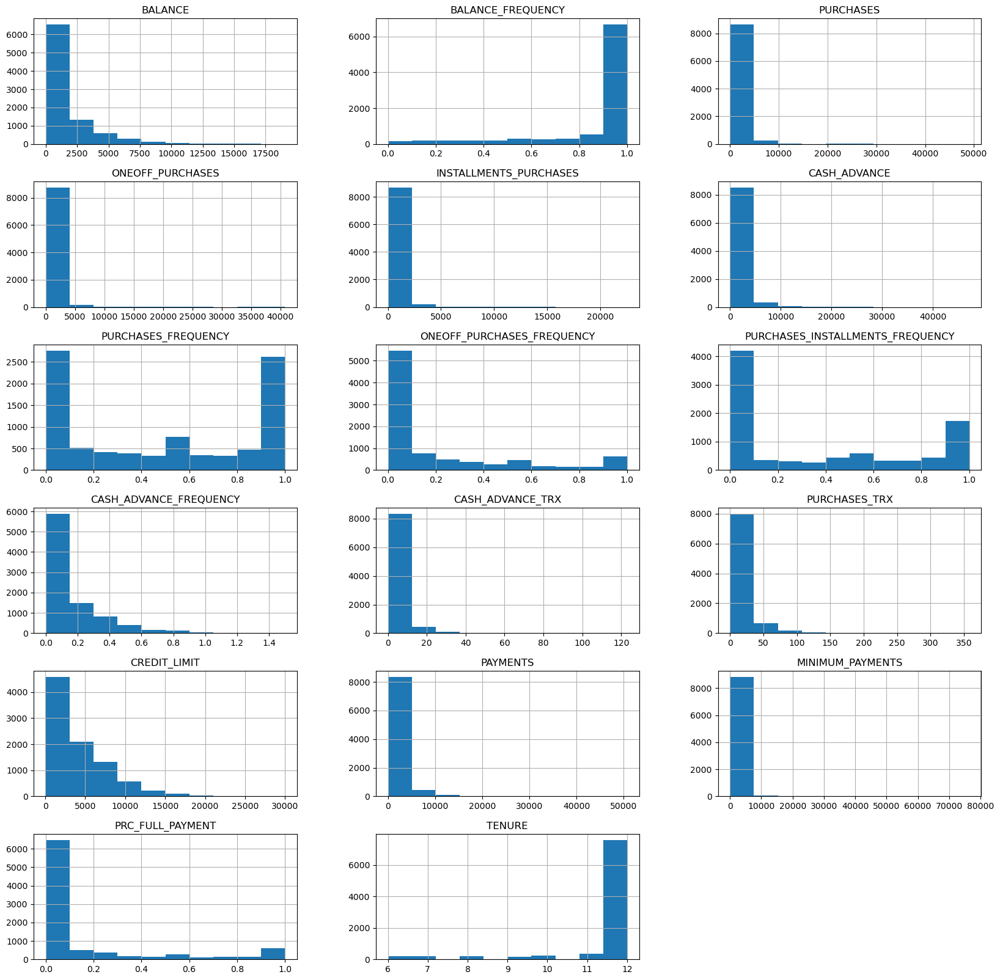

In [21]:
# investigate the distribution of the columns in the data
df.hist(bins=10, figsize=(20,20), layout=(6,3))
plt.show()

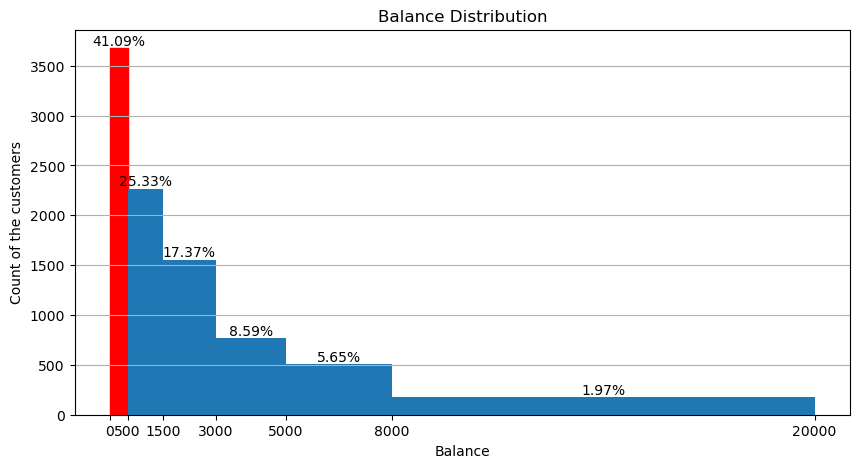

In [22]:
# BALANCE

bins = [0,500,1500,3000,5000, 8000,  20000]

plt.figure(figsize=(10, 5))
counts, edges, bars = plt.hist(df['BALANCE'], bins=bins)

bars[0].set_color('red')
plt.xticks(edges)


for bar, count in zip(bars, counts):
    plt.text(bar.get_x() + bar.get_width() / 2, count, f"{round(count*100/int(df.shape[0]),2)}%", ha='center', va='bottom')

plt.title('Balance Distribution' )
plt.xlabel('Balance')   
plt.ylabel('Count of the customers')

plt.grid(axis='y')
plt.show()


### Balance of 500 LE or less forms more than 41 % of the account in this bank dataset 
### .

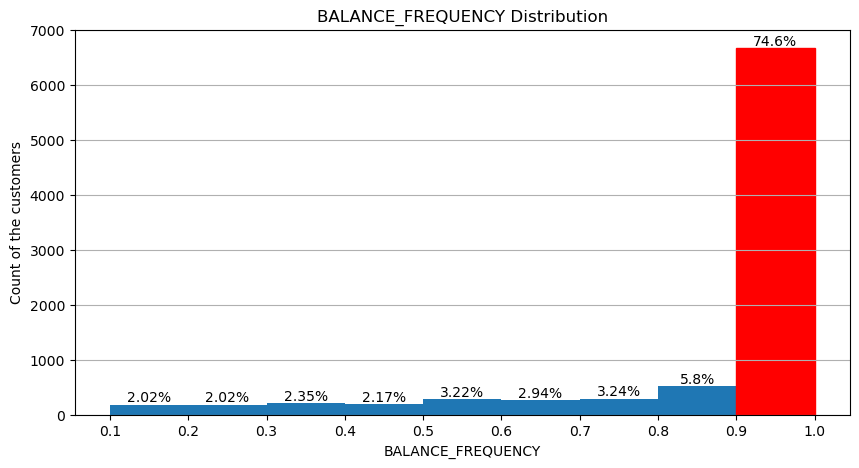

In [23]:
# BALANCE FREQUENCY

bins = [.1,.2,.3,.4,.5,.6,.7,.8,.9, 1]

plt.figure(figsize=(10, 5))
counts, edges, bars = plt.hist(df['BALANCE_FREQUENCY'], bins=bins)

bars[-1].set_color('red')
plt.xticks(edges)


for bar, count in zip(bars, counts):
    plt.text(bar.get_x() + bar.get_width() / 2, count, f"{round(count*100/int(df.shape[0]),2)}%", ha='center', va='bottom')

plt.title('BALANCE_FREQUENCY Distribution' )
plt.xlabel('BALANCE_FREQUENCY')   
plt.ylabel('Count of the customers')

plt.grid(axis='y')
plt.show()

# print("balance frequency :How frequently the Balance is updated, score between 0 and 1 \n")

### How frequently the Balance is updated, score between 0 and 1 
around 75% of the dataset acconts are being updated so often </br>
### .

In [24]:
print("the max credit limit is :",df.CREDIT_LIMIT.max(),"and min of credit limit is", df.CREDIT_LIMIT.min())

the max credit limit is : 30000.0 and min of credit limit is 50.0


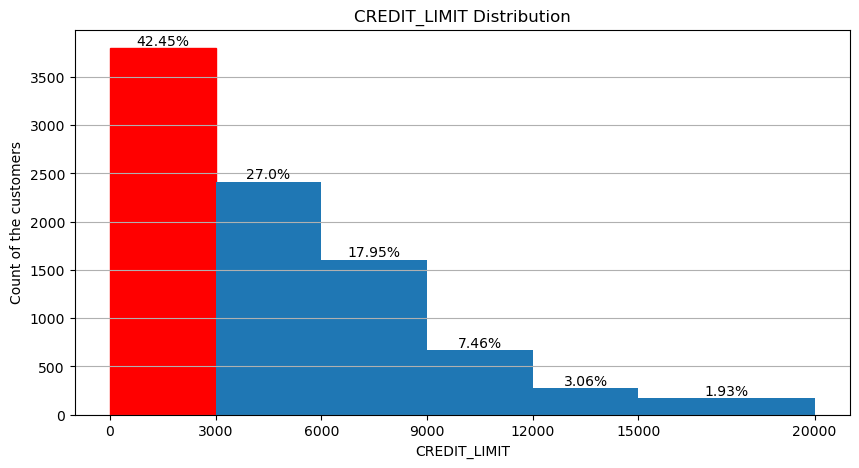

In [25]:
# credit limit

bins = [0,3000,6000,9000,12000,15000,20000]

plt.figure(figsize=(10, 5))
counts, edges, bars = plt.hist(df['CREDIT_LIMIT'], bins=bins)

bars[0].set_color('red')
plt.xticks(edges)


for bar, count in zip(bars, counts):
    plt.text(bar.get_x() + bar.get_width() / 2, count, f"{round(count*100/int(df.shape[0]),2)}%", ha='center', va='bottom')

plt.title('CREDIT_LIMIT Distribution' )
plt.xlabel('CREDIT_LIMIT')   
plt.ylabel('Count of the customers')

plt.grid(axis='y')
plt.show()


### more than 42% of the data set accounts are from accounts with less than 3000 LE credit limit 
#### .

In [26]:
df[["TENURE"]].value_counts()

TENURE
12        7584
11         365
10         236
6          203
8          196
7          190
9          175
Name: count, dtype: int64

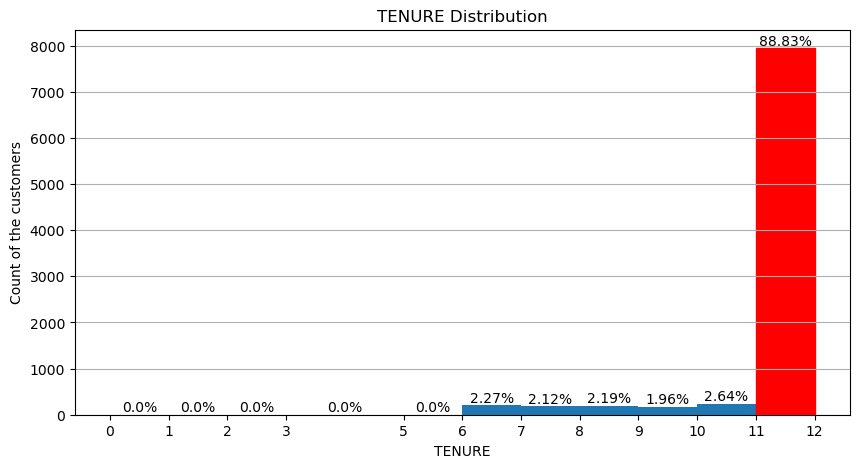

In [27]:
# tenure

bins = [0,1,2,3,5,6,7,8,9,10,11,12 ]

plt.figure(figsize=(10, 5))
counts, edges, bars = plt.hist(df['TENURE'], bins=bins)

bars[-1].set_color('red')
plt.xticks(edges)


for bar, count in zip(bars, counts):
    plt.text(bar.get_x() + bar.get_width() / 2, count, f"{round(count*100/int(df.shape[0]),2)}%", ha='center', va='bottom')

plt.title('TENURE Distribution' )
plt.xlabel('TENURE')   
plt.ylabel('Count of the customers')

plt.grid(axis='y')
plt.show()


### more than 88% of the accounts are opened from 11 to 12 years ago 
### .

## 4. <a name="4">Features transformation</a>
(<a href="#0">Go to top</a>)

*What is the feature scaling technique that would use and why?* <br>
*return to this section again and try another technique and see how that will impact your result*<br>
for more details on different methods for scaling check these links
- https://scikit-learn.org/stable/modules/preprocessing.html#preprocessing
- https://scikit-learn.org/stable/modules/classes.html#module-sklearn.preprocessing
- https://www.analyticsvidhya.com/blog/2020/07/types-of-feature-transformation-and-scaling/

Answer here:

In [28]:
# check the mean and std of each column 

m=df.mean()
s=df.std()
max=df.max()    
min=df.min()    

check = pd.DataFrame({'std': s ,'max':max,'mean': m,'min':min})

check


,std,max,mean,min
BALANCE,2081.584016,19043.13856,1564.647593,0.000000
BALANCE_FREQUENCY,0.236798,1.00000,0.877350,0.000000
PURCHASES,2136.727848,49039.57000,1003.316936,0.000000
ONEOFF_PURCHASES,1659.968851,40761.25000,592.503572,0.000000
INSTALLMENTS_PURCHASES,904.378205,22500.00000,411.113579,0.000000
CASH_ADVANCE,2097.264344,47137.21176,978.959616,0.000000
PURCHASES_FREQUENCY,0.401360,1.00000,0.490405,0.000000
ONEOFF_PURCHASES_FREQUENCY,0.298345,1.00000,0.202480,0.000000
PURCHASES_INSTALLMENTS_FREQUENCY,0.397451,1.00000,0.364478,0.000000
CASH_ADVANCE_FREQUENCY,0.200132,1.50000,0.135141,0.000000


In [29]:
# caculate the outliers in each column  

quartiles = df.quantile([0.25, 0.5, 0.75])
Q1 = quartiles.loc[0.25]
Q3 = quartiles.loc[0.75]
IQR = Q3 - Q1

upper_fence = Q3 + 1.5 * IQR
lower_fence = Q1 - 1.5 * IQR

upper_outliers = (df > upper_fence).sum()
lower_outliers = (df < lower_fence).sum()

outlier=pd.DataFrame({'upper_outliers':upper_outliers,'lower_outliers':lower_outliers,"total_outliers":upper_outliers+lower_outliers ,"% of the outliesrs in the data" : (upper_outliers+lower_outliers)*100/df.shape[0]})
outlier

# add the outliers to the check dataframe

check["total_outliers"]=upper_outliers+lower_outliers
check["% of the outliesrs in the data"]= (upper_outliers+lower_outliers)*100/df.shape[0]

check


,std,max,mean,min,total_outliers,% of the outliesrs in the data
BALANCE,2081.584016,19043.13856,1564.647593,0.000000,695,7.766231
BALANCE_FREQUENCY,0.236798,1.00000,0.877350,0.000000,1492,16.672254
PURCHASES,2136.727848,49039.57000,1003.316936,0.000000,808,9.028942
ONEOFF_PURCHASES,1659.968851,40761.25000,592.503572,0.000000,1013,11.319701
INSTALLMENTS_PURCHASES,904.378205,22500.00000,411.113579,0.000000,867,9.688233
CASH_ADVANCE,2097.264344,47137.21176,978.959616,0.000000,1030,11.509666
PURCHASES_FREQUENCY,0.401360,1.00000,0.490405,0.000000,0,0.000000
ONEOFF_PURCHASES_FREQUENCY,0.298345,1.00000,0.202480,0.000000,782,8.738407
PURCHASES_INSTALLMENTS_FREQUENCY,0.397451,1.00000,0.364478,0.000000,0,0.000000
CASH_ADVANCE_FREQUENCY,0.200132,1.50000,0.135141,0.000000,525,5.866577


### In the previous investigation it is obvious that the data contains high levels of ouliers 
### Robust scaller will be used to overcome this problem 

In [30]:
# finf any minse value in the data  
df[df<0].count()

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

In [32]:
# feature scaling 
# i will be using the robust scaler, the standard scaler , the log scaler and the log-cox scaler

from sklearn.preprocessing import RobustScaler,StandardScaler
# robust scaler
scaler = RobustScaler()
df_trans_robust = scaler.fit_transform(df)
df_trans_robust = pd.DataFrame(df_trans_robust, columns=df.columns)
df_trans_robust


# standard scaler
scaler2 = StandardScaler()
df_trans_standard = scaler2.fit_transform(df)
df_trans_standard = pd.DataFrame(df_trans_standard, columns=df.columns)
df_trans_standard


# log scaler
scaler3 = StandardScaler(copy=False, with_mean=False)
df_trans_log = scaler3.fit_transform(np.log1p(df))
df_trans_log = pd.DataFrame(df_trans_log, columns=df.columns)
df_trans_log




,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,1.855573,4.025622,1.566482,0.000000,1.481949,0.000000,0.555919,0.000000,0.284002,0.000000,0.000000,0.799741,8.429130,3.338699,4.193916,0.000000,19.696112
1,4.009892,4.354157,0.000000,0.000000,0.000000,2.459423,0.000000,0.000000,0.000000,1.423878,1.594584,0.000000,10.802222,5.228888,5.918248,0.948289,19.696112
2,3.885956,4.667406,2.280813,2.049108,0.000000,0.000000,2.499716,3.199159,0.000000,0.000000,0.000000,1.867169,10.886386,4.044134,5.464077,0.000000,19.696112
3,3.685600,3.316163,2.507609,2.252864,0.000000,1.495046,0.288659,0.369429,0.000000,0.510750,0.686750,0.504580,10.886386,0.000000,5.735436,0.000000,19.696112
4,3.332176,4.667406,0.971472,0.872782,0.000000,0.000000,0.288659,0.369429,0.000000,0.000000,0.000000,0.504580,8.651371,4.098474,4.668159,0.000000,19.696112
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,1.681142,4.667406,1.946626,0.000000,1.841579,0.000000,2.499716,0.000000,2.150655,0.000000,0.000000,1.416536,8.429130,3.638169,3.315720,1.916068,14.942542
8945,1.492709,4.667406,1.956894,0.000000,1.851293,0.000000,2.499716,0.000000,2.150655,0.000000,0.000000,1.416536,8.429130,3.534340,5.735436,0.000000,14.942542
8946,1.586934,4.081502,1.707402,0.000000,1.615265,0.000000,2.185924,0.000000,1.812482,0.000000,0.000000,1.304321,8.429130,2.771664,3.751728,1.054488,14.942542
8947,1.326971,4.081502,0.000000,0.000000,0.000000,1.016731,0.000000,0.000000,0.000000,0.983637,1.088473,0.000000,7.584664,2.501788,3.425127,1.054488,14.942542


## 5. <a name="5">K Means</a>
(<a href="#5">Go to top</a>)

1- Use the k means class that you implemented in the previous task to cluster this data
2- Use http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html and see if the difference in the result
3- Use elbow method to determine the K (plot the result using two plot one for distorion and another for inertia)
4- (Optionally) make a method that pick the best number of clusters for you 
5- Using different techniques for scaling and comment on the result

### My_kmean Function and class

In [31]:
# my kmean as function 

def findClosestCentroids(X, centroids):
    ll=np.array([])
    for i in centroids:
        l=np.linalg.norm(X-i,axis=1)
        ll=np.append(ll,l)  
    ll=ll.reshape(len(centroids),X.shape[0]).T
    idx=np.argmin(ll,axis=1)
    return idx 


def computeCentroids(X, idx, K):
    centroids=np.zeros((K,X.shape[1]))
    for i in range(K):
        var=np.where(idx==i)
        centroids[i]=np.mean(X[var],axis=0)
    return centroids


def kMeansInitCentroids(X, K):
    centroids=[]
    ran = np.random.choice(X.shape[0], K, replace=False)
    for i in range(K):
        centroids.append(X[ran[i]])
    centroids=np.array(centroids)    
    return centroids


def k_means(X,K,i=100):
    centroids=kMeansInitCentroids(X, K)
    for i in range(1,i):
        idx = findClosestCentroids(X, centroids)
        centroids = computeCentroids(X, idx, K)
    return centroids, idx


def predict(centroids,x):
    label = findClosestCentroids(x, centroids)
    return label


In [32]:
# construct my kmean class

class my_kmean:

    def __init__(self,k,i):
        self.k=k
        self.i=i


    def fit(self,X):
        # convert the dataframe to array    
        if type(X)== pd.core.frame.DataFrame :
            X=np.array(X)
        self.centroids=self.kMeansInitCentroids(X, self.k)
        for ii in range(self.i):
            self.idx = self.findClosestCentroids(X, self.centroids)
            self.centroids = self.computeCentroids(X, self.idx, self.k)     
        return self.centroids, self.idx


    def kMeansInitCentroids(self, X, k):
        self.centroids=[]
        self.ran = np.random.choice(X.shape[0], k, replace=False)
        for i in range(k):
            self.centroids.append(X[self.ran[i]])
        self.centroids=np.array(self.centroids)    
        return self.centroids


    def findClosestCentroids(self, X, centroids):
        ll=np.array([])
        for i in centroids:
            l=np.linalg.norm(X-i,axis=1)
            ll=np.append(ll,l)  
        ll=ll.reshape(len(centroids),X.shape[0]).T
        idx=np.argmin(ll,axis=1)
        return idx
    

    def computeCentroids(self, X, idx, k):
        self.centroids=np.zeros((k,X.shape[1]))
        for i in range(k):
            self.var=np.where(idx==i)[0]
            self.centroids[i]=np.mean(X[self.var],axis=0)
        return self.centroids
    

In [33]:
# try the kmean class
# number of iterations = 2000 

my_km=my_kmean(3,2000)
centers , labelss = my_km.fit(df_trans_robust)


# try the mykmean class labels 
ii=0
for i in labelss :
    print(i, end=" ")   
    ii+=1
    if ii==100:
        break


1 1 1 2 1 1 0 1 1 2 1 1 1 1 1 1 1 2 1 1 1 0 2 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 2 1 1 1 1 1 1 2 1 1 1 1 1 1 1 2 1 1 0 1 1 1 1 1 2 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 2 2 2 0 1 1 1 1 1 0 1 1 1 1 1 1 1 2 2 

In [34]:
# use the kmeans classifier with robust scaled data


from sklearn.cluster import KMeans
kmeans_robust = KMeans(n_clusters=3, random_state=42, n_init="auto") .fit(df_trans_robust)
kmeans_robust.labels_
# kmeans_robust.cluster_centers_

# compare the sklearn kmean output with my kmean output

print("the sklearn kmean output labels are :")

ii=0
for i in kmeans_robust.labels_ :
    print(i, end=" ")
    ii+=1
    if ii==100:
        break

labelss=np.array(labelss)
print("\nmy kmean output labels are :")

ii=0
for i in labelss : 
    print(i,end=" ") 
    ii+=1
    if ii==100:
        break    


the sklearn kmean output labels are :
1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 2 2 0 1 0 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 
my kmean output labels are :
1 1 1 2 1 1 0 1 1 2 1 1 1 1 1 1 1 2 1 1 1 0 2 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 2 1 1 1 1 1 1 2 1 1 1 1 1 1 1 2 1 1 0 1 1 1 1 1 2 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 2 2 2 0 1 1 1 1 1 0 1 1 1 1 1 1 1 2 2 

### There are some differences between (myKeams class) results and the (sklearn class); i think due some specific options embedded in the (skelearn class)

- For every attempt with myKmean class the labels of the points are different <br/>
that is because the initialcentroides method randomly pick K points every time it is called <br/>
and for the (skelean class) the random state is fixed <br/>






.






### Emplement the T-SNE dimensionality reduction method 

In [22]:
# use t-SNE for visualization

from sklearn.manifold import TSNE

# c is the cluster labels

def draw_tsne(data , c=None, text=None):
    tsne = TSNE(n_components=2 , random_state=20)
    tsne_data = tsne.fit_transform(data)

    plt.figure(figsize=(7,7))
    sns.scatterplot(x=tsne_data[:, 0], y=tsne_data[:, 1], hue=c, palette=sns.color_palette('tab10', len(np.unique(c))),markers='o')
    plt.title(f'T-SNE Cluster Visualization of {text}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.show()

### Emplement the elbow method using the distortion and inertia methods 


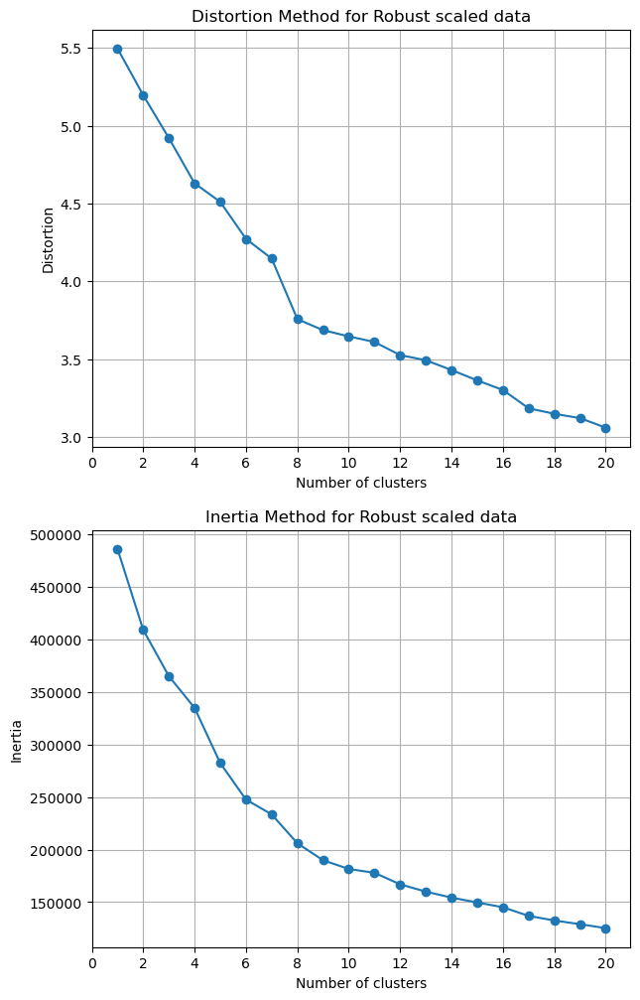

In [35]:
# implement the elbow method to find the optimal number of clusters
# use the distortion method and inertia method  

from scipy.spatial.distance import cdist

distortions = []
inertia=[]

# n=number of the maximum number of clusters
n=20

for i in range(1, n+1):

    # use the robust scaled data
    kmeans_rob_graph = KMeans(n_clusters=i, random_state=20, n_init="auto") .fit(df_trans_robust)

    distortions.append(sum(np.min(cdist(df_trans_robust, kmeans_rob_graph.cluster_centers_, 'euclidean'), axis=1)) / df_trans_robust.shape[0])
    inertia.append(kmeans_rob_graph.inertia_)


# plot the distortion methos
plt.figure(figsize=(7, 12))
plt.subplot(2, 1, 1)    
plt.plot(range(1, n+1), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.xticks(range(0, n+1, 2))  

plt.ylabel('Distortion')
plt.title('Distortion Method for Robust scaled data')
plt.grid()

# plot the inertia methos   
plt.subplot(2, 1, 2)    
plt.plot(range(1, n+1), inertia, marker='o')
plt.xlabel('Number of clusters')
plt.xticks(range(0, n+1, 2))  

plt.ylabel('Inertia')
plt.title('Inertia Method for Robust scaled data')
plt.grid()

plt.show()



### From the previous graphs the values of either the inertia or the distortion show clear declination after number of clusters >6 
### I will take the number of clusters to be 8

.

### Now repeat the process with standard, logistic scaled data 

In [33]:
# kmean with the srandard scaled data, robust scaled data and log scaled data

from sklearn.cluster import KMeans
kmeans_standard = KMeans(n_clusters=8, random_state=42, n_init=150) .fit(df_trans_standard)
kmeans_standard.labels_
# kmeans_standard.cluster_centers_


kmeans_robust = KMeans(n_clusters=8, random_state=42, n_init=150) .fit(df_trans_robust)
kmeans_robust.labels_
# kmeans_robust.cluster_centers_


kmeans_log = KMeans(n_clusters=8, random_state=42, n_init=150) .fit(df_trans_log)
kmeans_log.labels_
# kmeans_log.cluster_centers_




# compare the sklearn kmean output with my kmean output

print("the kmean labels with standard scaled data are :")
ii=0
for i in kmeans_standard.labels_ :
    print(i, end=" ")
    ii+=1
    if ii==100:
        break


print("\n the kmean labels with robust scaled data are  :")
ii=0
for i in kmeans_robust.labels_ :
    print(i, end=" ")   
    ii+=1
    if ii==100:
        break


print("\n the kmean labels with log scaled data are  :")
ii=0
for i in kmeans_log.labels_ :
    print(i, end=" ")   
    ii+=1
    if ii==100:
        break




the kmean labels with standard scaled data are :
2 4 7 2 2 1 3 1 2 0 1 2 1 1 2 4 6 0 1 1 1 3 1 4 2 1 2 1 4 2 4 1 2 7 1 2 4 7 4 4 2 2 2 2 1 2 6 2 7 2 4 7 2 7 1 2 2 7 2 2 2 2 2 0 1 2 6 2 1 2 1 4 6 2 2 1 7 1 2 4 1 0 0 0 7 7 4 4 2 4 3 4 2 2 2 2 7 2 0 6 
 the kmean labels with robust scaled data are  :
0 5 0 3 0 0 2 0 0 3 0 0 0 0 0 0 0 3 0 7 7 2 3 5 0 0 0 0 5 0 5 0 0 0 7 0 5 0 5 5 0 0 0 0 0 0 3 0 6 0 5 0 0 0 3 0 0 2 0 0 0 0 5 3 0 0 0 0 0 0 0 5 0 0 0 0 0 0 7 5 0 3 3 6 2 6 5 5 0 5 7 5 0 0 0 0 0 0 6 3 
 the kmean labels with log scaled data are  :
0 2 5 5 5 1 6 1 5 5 1 5 6 6 2 3 7 4 1 1 1 3 1 3 2 1 2 1 3 4 3 1 2 5 1 2 2 3 2 3 2 3 5 2 6 1 7 2 6 5 3 6 2 5 1 5 5 6 2 3 5 5 2 0 1 5 7 2 1 5 3 3 7 1 5 1 6 1 2 3 4 0 4 4 6 6 3 3 2 2 3 3 2 5 5 2 5 2 0 0 

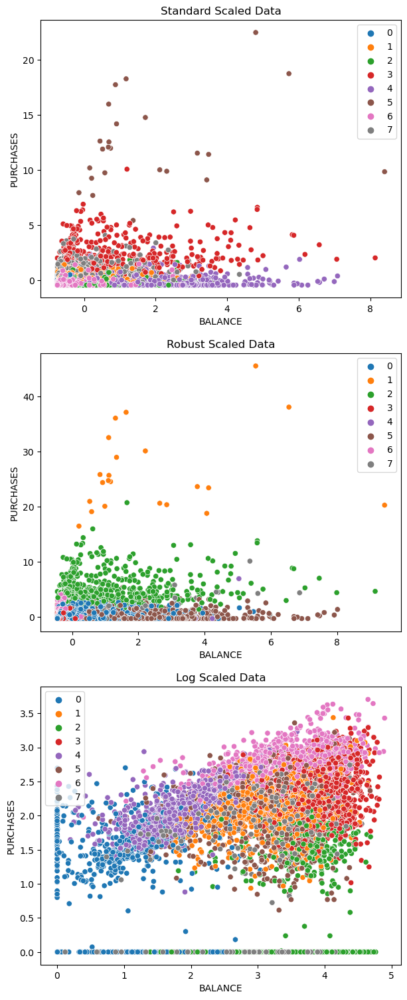

In [39]:
# plot the kmean with standard scaled data and robust scaled data
# compare just the "Balance" and "Purchase" features

# plot the kmean with standard scaled data
plt.figure(figsize=(7,25))
plt.subplot(4,1, 1)
sns.scatterplot(x=df_trans_standard['BALANCE'], y=df_trans_standard['PURCHASES'], hue=kmeans_standard.labels_, palette=sns.color_palette('tab10', 8))
plt.title("Standard Scaled Data")
plt.xlabel("BALANCE")
plt.ylabel("PURCHASES") 


# plot the kmean with robust scaled data
plt.subplot(4,1, 2)
sns.scatterplot(x=df_trans_robust['BALANCE'], y=df_trans_robust['PURCHASES'], hue=kmeans_robust.labels_, palette=sns.color_palette('tab10', 8))
plt.title("Robust Scaled Data")
plt.xlabel("BALANCE")
plt.ylabel("PURCHASES")


#plot the kmean with log scaled data
plt.subplot(4,1, 3)
sns.scatterplot(x=df_trans_log['BALANCE'], y=df_trans_log['PURCHASES'], hue=kmeans_log.labels_, palette=sns.color_palette('tab10', 8))
plt.title("Log Scaled Data")
plt.xlabel("BALANCE")
plt.ylabel("PURCHASES")




plt.show()

### The comparison shows difference in points labels the belonging to each cluster 
### The robust transformed data is slightly smaller in cluster sizes which is better 

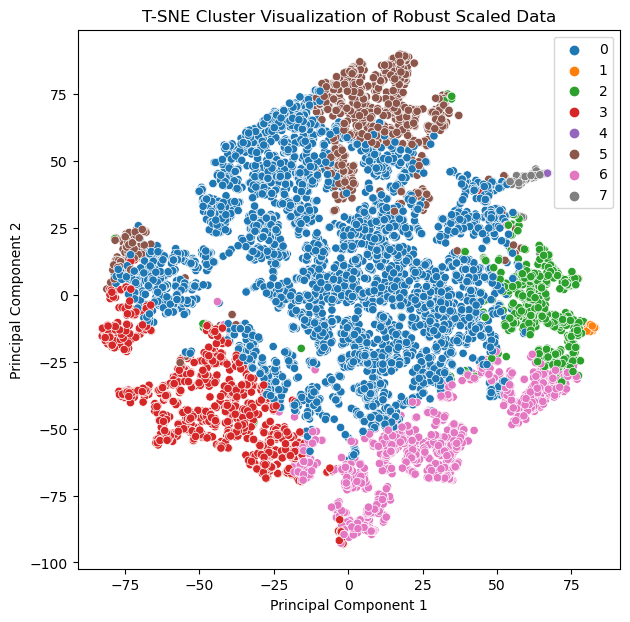

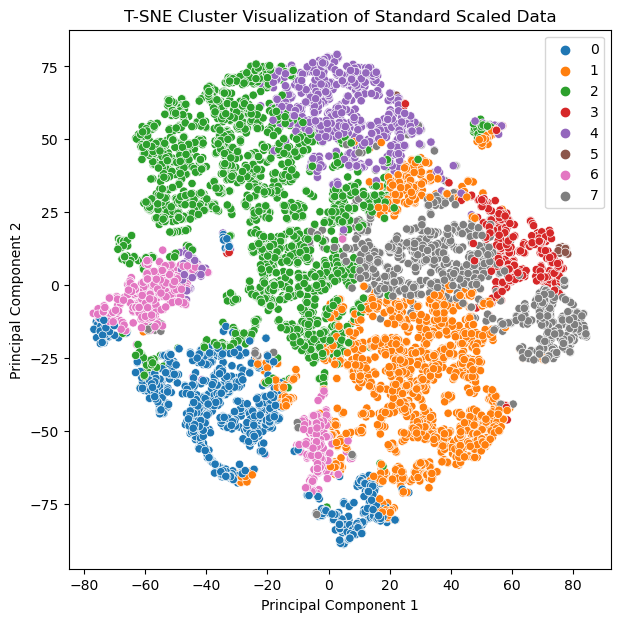

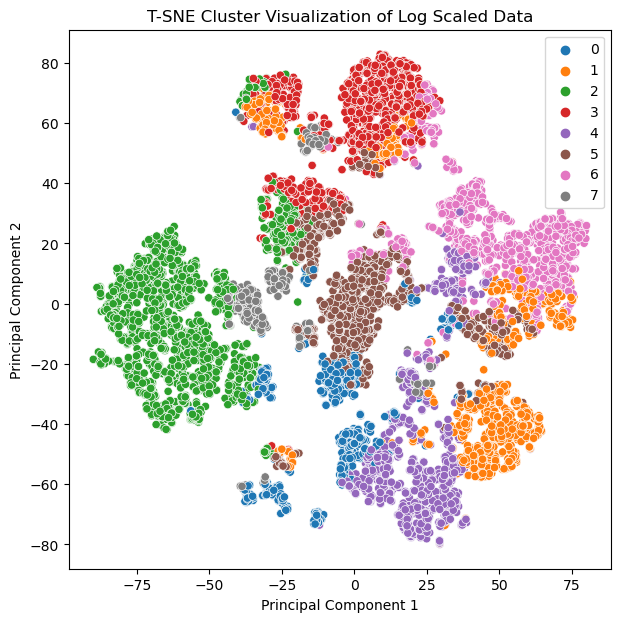

In [35]:
# plot the tsne with standard scaled data, log scaled data and robust scaled data

draw_tsne(df_trans_robust, kmeans_robust.labels_ , text="Robust Scaled Data")
draw_tsne(df_trans_standard, kmeans_standard.labels_ , text="Standard Scaled Data")
draw_tsne(df_trans_log, kmeans_log.labels_ , text="Log Scaled Data")

### The comparison shows that the robust scaler is better in T-SNE
log scaler is better in the formed clusters<br/>
the the points of each cluster is likely to be closer to each other  

.

In [40]:
# manually  selecting the features
# the features with higher correlation and importance are selected

# select 9 features
df_features_robust = df_trans_robust[['BALANCE', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'TENURE']]
df_features_standard = df_trans_standard[['BALANCE', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'TENURE']]
df_feature_log= df_trans_log[['BALANCE', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'TENURE']]

# select 2 features
# df_features_robust = df_trans_robust[['BALANCE', 'PURCHASES']]
# df_features_standard = df_trans_standard[['BALANCE', 'PURCHASES']]
# df_feature_log= df_trans_log[['BALANCE', 'PURCHASES']]

### .

#### Try the previous study ,but with selected features 

In [41]:
# kmeans with standard scaled data and compare the results with the robust  scaled data


from sklearn.cluster import KMeans
kmeans_standard = KMeans(n_clusters=8, random_state=42, n_init="auto") .fit(df_features_standard)
kmeans_standard.labels_
# kmeans_standard.cluster_centers_


kmeans_robust = KMeans(n_clusters=8, random_state=42, n_init="auto") .fit(df_features_robust)
kmeans_robust.labels_
# kmeans_robust.cluster_centers_

k_means_log = KMeans(n_clusters=8, random_state=42, n_init="auto") .fit(df_feature_log)
k_means_log.labels_
# k_means_log.cluster_centers_


# compare the sklearn kmean output with my kmean output
ii=0
print("the kmean labels with standard scaled data are :")
for i in kmeans_standard.labels_ :
    print(i, end=" ")
    ii+=1
    if ii==100:
        break

ii=0
print("\n the kmean labels with robust scaled data are  :")
for i in kmeans_robust.labels_ :
    print(i, end=" ")   
    ii+=1
    if ii==100:
        break

ii=0
print("\n the kmean labels with log scaled data are  :")
for i in k_means_log.labels_ :
    print(i, end=" ")   
    ii+=1
    if ii==100:
        break



the kmean labels with standard scaled data are :
1 6 2 2 1 1 4 1 2 2 1 1 2 2 1 6 7 1 2 6 6 4 1 0 6 1 1 1 6 2 6 2 6 1 6 1 6 2 6 0 1 1 1 1 6 1 7 1 2 1 0 2 1 7 1 2 1 4 1 6 2 1 1 1 1 1 7 1 2 1 6 0 7 1 2 6 2 1 1 6 1 2 2 1 4 2 6 6 1 6 3 1 1 1 1 1 2 1 2 7 
 the kmean labels with robust scaled data are  :
1 0 1 1 1 1 2 1 1 1 1 1 6 6 1 0 1 1 1 5 5 2 1 7 0 1 1 1 0 1 0 1 0 1 5 1 0 6 0 7 1 1 1 1 6 1 1 1 6 1 7 6 1 6 1 1 1 6 1 0 1 1 0 1 0 1 1 1 0 1 0 7 1 1 1 0 1 1 5 0 1 1 1 1 6 1 0 0 1 0 5 0 1 1 1 1 1 1 1 1 
 the kmean labels with log scaled data are  :
1 0 2 2 2 3 7 3 7 2 3 2 7 7 0 5 6 1 7 3 3 5 1 5 0 1 2 1 5 1 5 7 5 2 5 4 0 5 5 5 4 5 2 4 7 3 6 4 7 2 5 7 0 2 1 2 2 7 0 5 2 2 0 2 3 3 6 4 7 2 5 5 6 3 7 5 2 3 4 5 1 4 1 1 5 2 5 5 0 0 5 5 4 2 2 4 2 4 1 6 

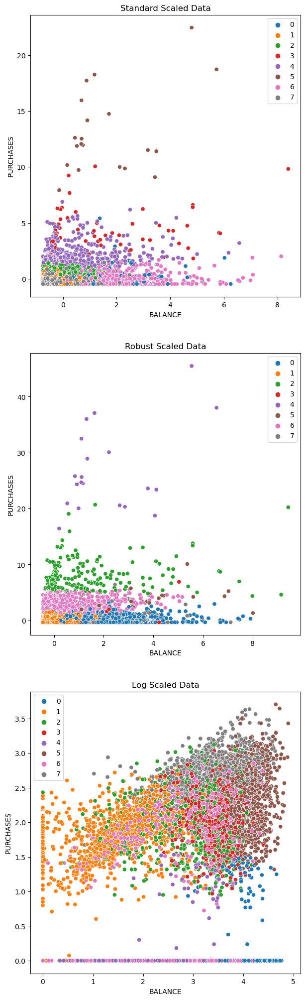

In [44]:
# SELECTED FEATURES

# plot the kmean with standard scaled data and robust scaled data
# compare just the "Balance" and "Purchase" features

# plot the kmean with standard scaled data
plt.figure(figsize=(7,25))
plt.subplot(3,1, 1)
sns.scatterplot(x=df_features_standard['BALANCE'], y=df_features_standard['PURCHASES'], hue=kmeans_standard.labels_, palette=sns.color_palette('tab10', 8))
plt.title("Standard Scaled Data")
plt.xlabel("BALANCE")
plt.ylabel("PURCHASES") 


# plot the kmean with robust scaled data
plt.subplot(3,1, 2)
sns.scatterplot(x=df_features_robust['BALANCE'], y=df_features_robust['PURCHASES'], hue=kmeans_robust.labels_, palette=sns.color_palette('tab10', 8))
plt.title("Robust Scaled Data")
plt.xlabel("BALANCE")
plt.ylabel("PURCHASES")

# plot the kmean with log scaled data
plt.subplot(3,1, 3)
sns.scatterplot(x=df_feature_log['BALANCE'], y=df_feature_log['PURCHASES'], hue=k_means_log.labels_, palette=sns.color_palette('tab10', 8))
plt.title("Log Scaled Data")
plt.xlabel("BALANCE")
plt.ylabel("PURCHASES")

plt.show()

### The comparison shows a smaller difference in points than the full feature case 
### The robust transformed data is better in clustering than the standard ones 

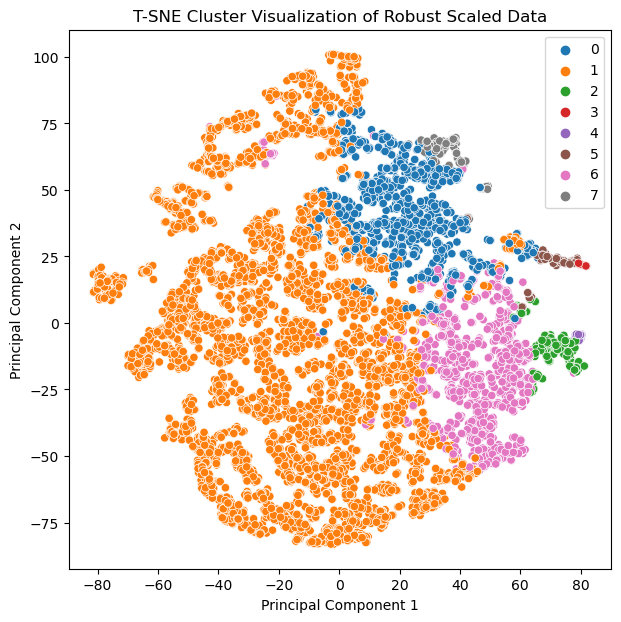

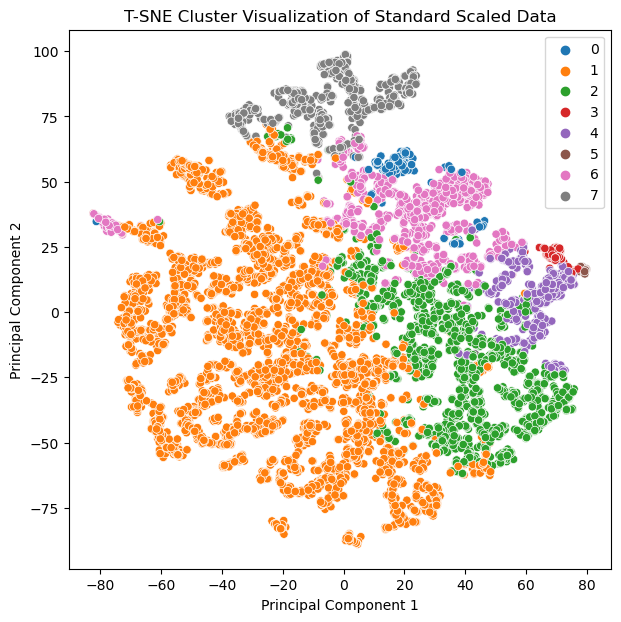

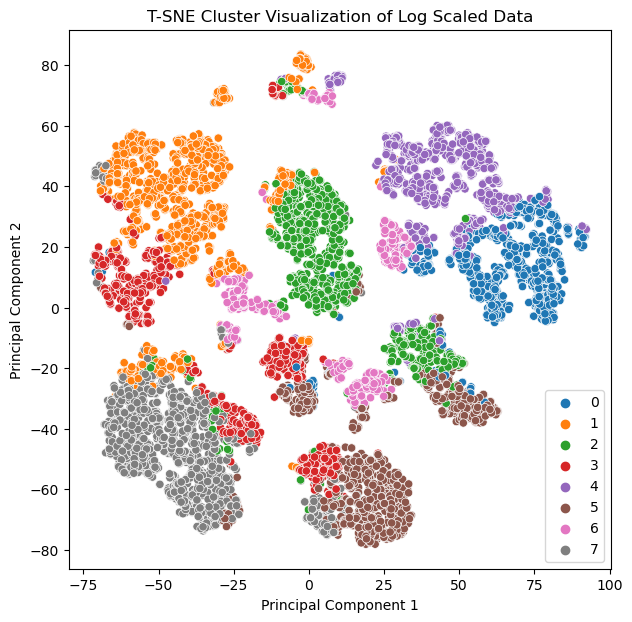

In [45]:
# for the selected features
# plot the tsne with standard scaled data and robust scaled data

draw_tsne(df_features_robust, kmeans_robust.labels_ , text="Robust Scaled Data")
draw_tsne(df_features_standard, kmeans_standard.labels_ , text="Standard Scaled Data")
draw_tsne(df_feature_log, k_means_log.labels_ , text="Log Scaled Data")


### The results has been enhanced with feature selection modification 
the robust scaler shows again better performance <br/>
log scaled data has been improved

# .

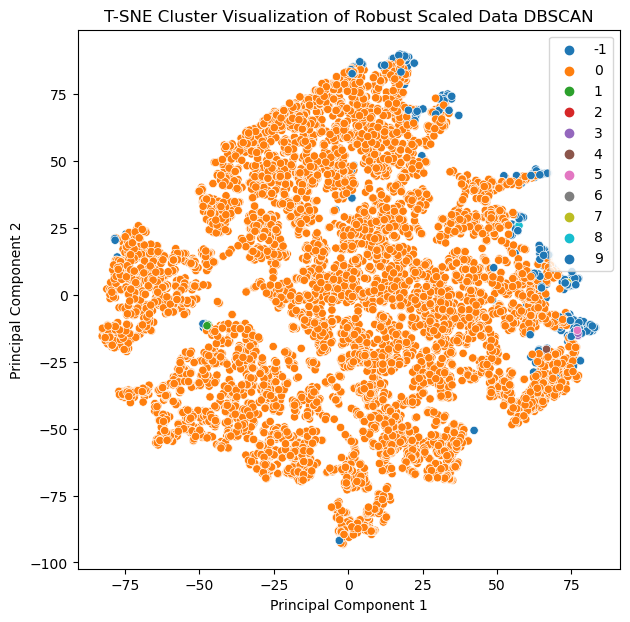

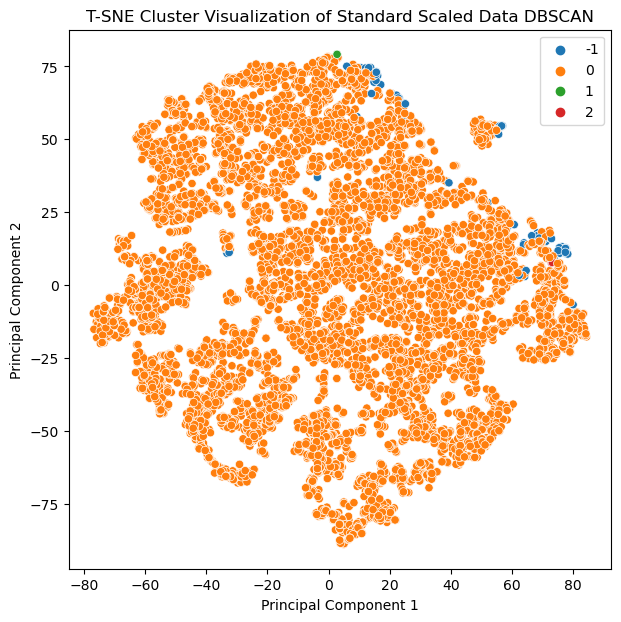

In [78]:
# DBSCAN to handle the unusable data clusters

from sklearn.cluster import DBSCAN

# dbscan with robust scaled data
# try eps=0.2 == > eps = 5 and min_samples=2 ==> min_samples = 5

dbscan_robust=DBSCAN(eps=4, min_samples=3)
dbscan_robust.fit(df_trans_robust)
draw_tsne(df_trans_robust, dbscan_robust.labels_ , text="Robust Scaled Data DBSCAN")


# dbscan with standard scaled data
# try eps=0.2 == > eps = 5 and min_samples=2 ==> min_samples = 5

dbscan_standard=DBSCAN(eps=4, min_samples=3)
dbscan_standard.fit(df_trans_standard)
draw_tsne(df_trans_standard, dbscan_standard.labels_ , text="Standard Scaled Data DBSCAN")

### Using the DBSCAN is usless in our case since the point are very close to each other 
notice the outliers
### .

## 6. <a name="5">Training and hyperparamter tuning</a>
(<a href="#0">Go to top</a>)


###Before we start the training process we need to specify 3 paramters:<br>
1- Linkage criteria : The linkage criterion determines the distance between two clusters
    - Complete-Linkage Clustering
    - Single-Linkage Clustering
    - Average-Linkage Clustering
    - Centroid Linkage Clustering
2- Distance function:
    - Euclidean Distance 
    - Manhattan Distance 
    - Mahalanobis distance 
3- Number of clusters


### *Number of clusters*
Use Dendograms to specify the optimum number of clusters
- Compare how changing linkage criteria or distance function would affect the optimum number of clusters
- you can use silhouette_score or any other evalution method to help you determine the optimum number of clusters
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html

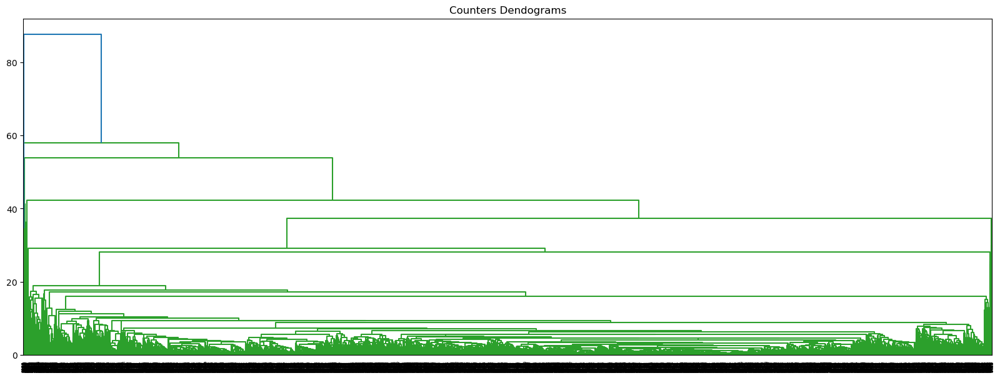

In [41]:
import scipy.cluster.hierarchy as shc

# in this case i have selected the following 
# linkage = 'average', distance function  = 'euclidean'

plt.figure(figsize=(20, 7))
plt.title("Counters Dendograms")
dend = shc.dendrogram(shc.linkage(y=df_trans_robust , method="average",metric='euclidean'),orientation='top') #fill y with your dataframe
                                                                                      #and method with linkage criteria
                                                                                      #and metric with distance function

### Add threshold cut to the dendrogram at distance 25 as it more likely to be largely-increasing afterwards

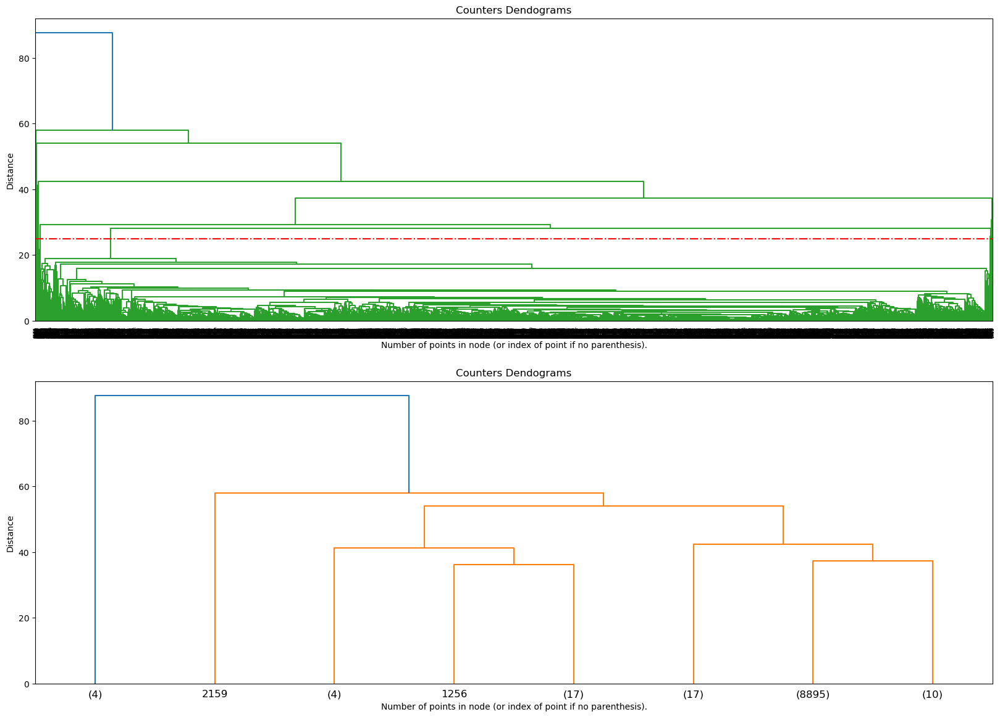

In [42]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(20, 14))
plt.subplot(2,1,1)
plt.title("Counters Dendograms")
dend = shc.dendrogram(shc.linkage(y=df_trans_robust , method="average",metric='euclidean'),orientation='top' ) 
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.ylabel("Distance")
plt.axhline(y=25, color='r', linestyle='dashdot')  


# at the required threshold distance the number of clusters are 8
plt.subplot(2,1,2)
plt.title("Counters Dendograms")
dend = shc.dendrogram(shc.linkage(y=df_trans_robust , method="average",metric='euclidean'),orientation='top',truncate_mode="lastp", p=8 ) 
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.ylabel("Distance")
plt.show()


#### The number of clusters after cutting at distance 25 is 8 clusters
for the x axis the number of the points or (index of the point) if in parentheses

.

### Now change the linkage criteria to complete and centroid

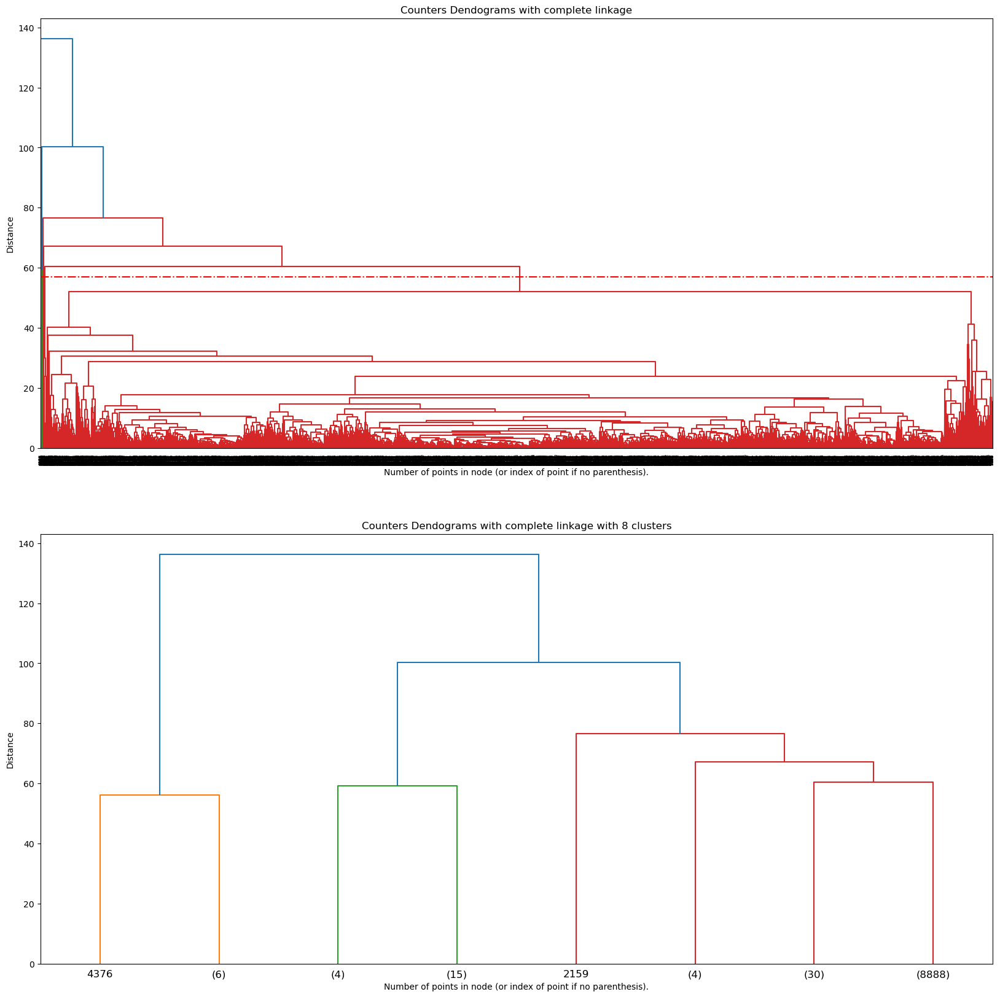

In [43]:
# change the linkage method to complete
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(20, 20))
plt.subplot(2,1,1)
plt.title("Counters Dendograms with complete linkage")
dend = shc.dendrogram(shc.linkage(y=df_trans_robust , method="complete",metric='euclidean'),orientation='top' ) 
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.ylabel("Distance")
plt.axhline(y=57, color='r', linestyle='dashdot')  


# at the required threshold distance the number of clusters are 8
plt.subplot(2,1,2)
plt.title("Counters Dendograms with complete linkage with 8 clusters")
dend = shc.dendrogram(shc.linkage(y=df_trans_robust , method="complete",metric='euclidean'),orientation='top',truncate_mode="lastp", p=8 ) 
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.ylabel("Distance")

plt.show()

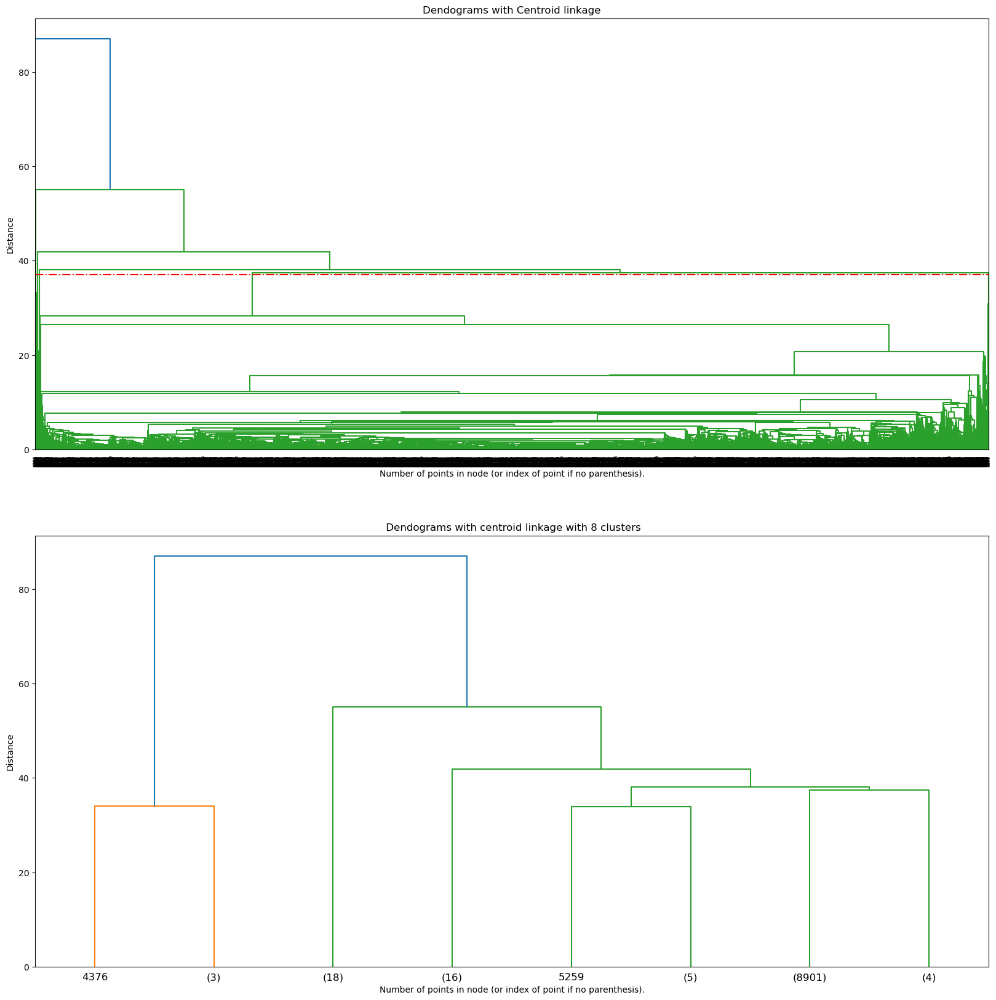

In [44]:
# change the linkage method to centroid

plt.figure(figsize=(20, 20)) 
plt.subplot(2,1,1)
plt.title("Dendograms with Centroid linkage")
dend = shc.dendrogram(shc.linkage(y=df_trans_robust , method="centroid",metric='euclidean'),orientation='top' ) 
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.ylabel("Distance")
plt.axhline(y=37, color='r', linestyle='dashdot') 

# at the required threshold distance the number of clusters are 8
plt.subplot(2,1,2)
plt.title(" Dendograms with centroid linkage with 8 clusters")
dend = shc.dendrogram(shc.linkage(y=df_trans_robust , method="centroid",metric='euclidean'),orientation='top',truncate_mode="lastp", p=8 ) 
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.ylabel("Distance")

plt.show()

### Making any change in the method of the linkage will affect the hierarchical diagram and will affect the clusters

# .

#### Implement the silhouette method

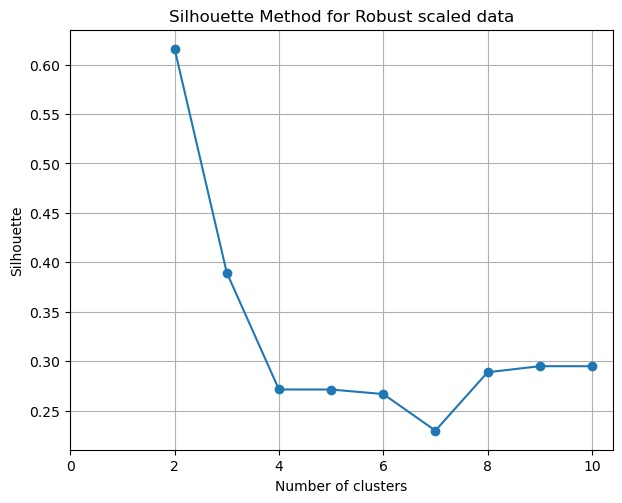

In [45]:
# implement the silhouette method

from sklearn.metrics import silhouette_score

silhouette=[]
# n is the number of clusters
n=10

for i in range(2,n+1):
    kmeans = KMeans(n_clusters=i, random_state=20, n_init="auto").fit(df_trans_robust)
    silhouette.append(silhouette_score(df_trans_robust, kmeans.labels_))

plt.figure(figsize=(7, 12))
plt.subplot(2, 1, 1)    
plt.plot(range(2, n+1), silhouette, marker='o')
plt.xlabel('Number of clusters')
plt.xticks(range(0, n+1, 2))  

plt.ylabel('Silhouette')
plt.title('Silhouette Method for Robust scaled data')
plt.grid()


### As shown from the previous garph (Silhouette method) at number of clusters = 8 the points of each cluster is more related to its cluster 
### .

### Agglomerative Clustering

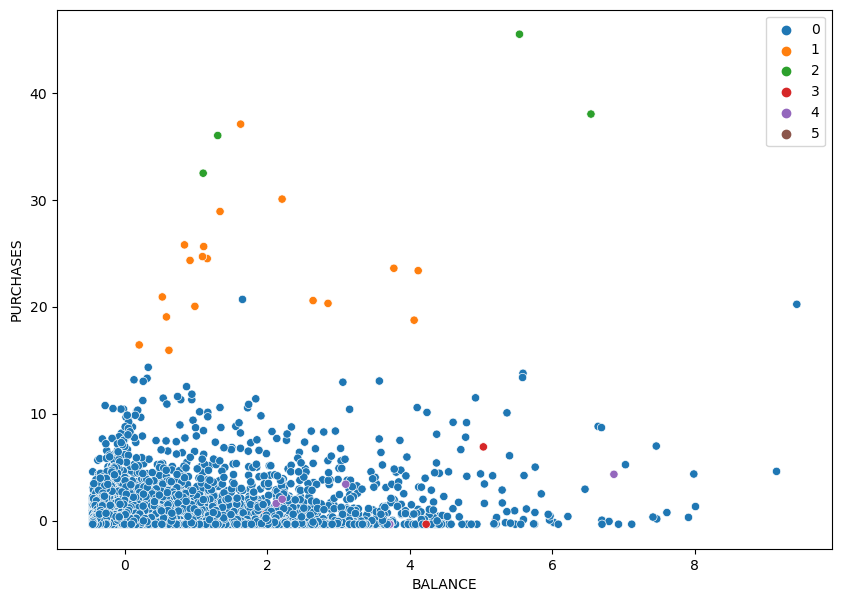

In [46]:
#training
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=6, affinity='euclidean', linkage='average')

labels_agg = cluster.fit(df_trans_robust)

plt.figure(figsize=(10, 7))

sns.scatterplot(x=df_trans_robust['BALANCE'], y=df_trans_robust['PURCHASES'], hue=labels_agg.labels_, palette=sns.color_palette('tab10', 6))
plt.xlabel('BALANCE')
plt.ylabel('PURCHASES')
plt.show()



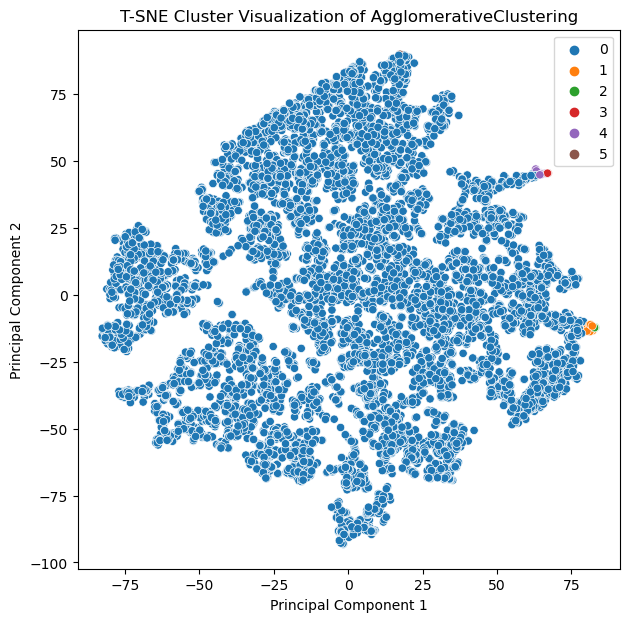

In [67]:
# tsne to visualize the clusters
draw_tsne(data=df_trans_robust, c=labels_agg.labels_, text="AgglomerativeClustering")


#### Most of the data belongs to the 0 cluster 
### .

In [47]:
# count the number of observations in each cluster

print("the number of observations in each cluster are :")
pd.DataFrame(labels_agg.labels_).value_counts().sort_values(ascending=False)


the number of observations in each cluster are :


0    8905
1      18
4      17
2       4
3       4
5       1
Name: count, dtype: int64

## The Gassian Mixture Model

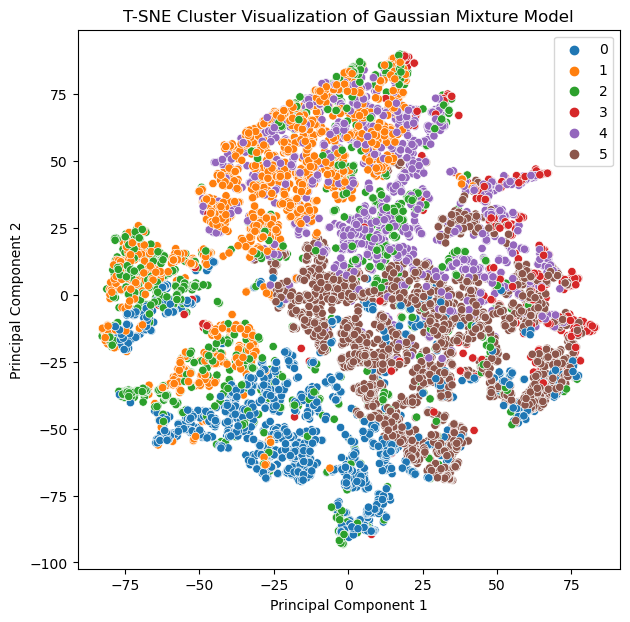

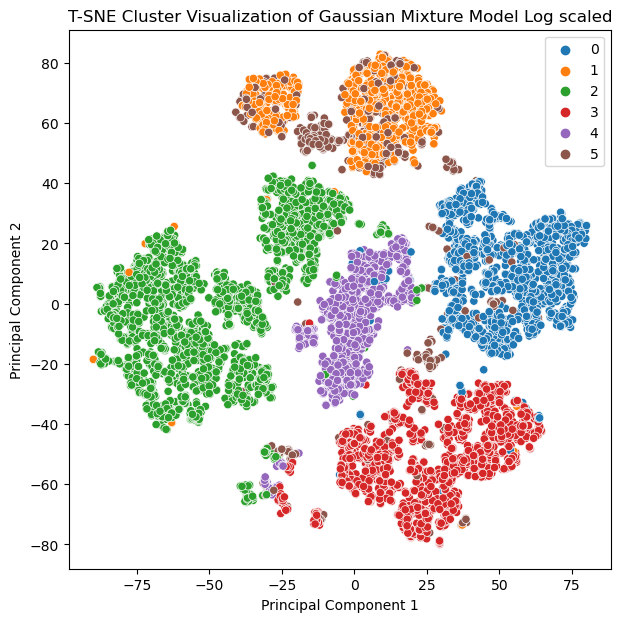

In [62]:
# gassian mixture model

from sklearn.mixture import GaussianMixture

# run the gmm model with 6 clusters robust scaled
gmm_robust = GaussianMixture(n_components=6, random_state=20).fit(df_trans_robust)
draw_tsne(data=df_trans_robust, c=gmm_robust.predict(df_trans_robust), text="Gaussian Mixture Model robust scaled")

# run the gmm model with 6 clusters log scaled
gmm_log = GaussianMixture(n_components=6, random_state=20).fit(df_trans_log)
draw_tsne(data=df_trans_log, c=gmm_log.predict(df_trans_log), text="Gaussian Mixture Model Log scaled")



### From the previous graphs the kmean is better in robust scaled data, but the GMM is better for the log scaled data 
the comparison carried out for both <br/>
robust scaled data and log scaled data 

## 6. <a name="6">improvement ideas</a>
(<a href="#0">Go to top</a>)

- Try to use PCA to reduce the number of features and compare how this will affect the clustring process
- Try to run your code again but with different tranformation technique
- Implement gap statistics method and use it as evaluation metric and compare the result with what you did before https://www.datanovia.com/en/lessons/determining-the-optimal-number-of-clusters-3-must-know-methods/#gap-statistic-method 

In [63]:
#pca to find the number of components to keep 85% of variance

from sklearn.decomposition import PCA
pca = PCA().fit(df_trans_robust)


# Find the number of components to keep 85% of variance
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)
cumulative_variance_ratio

n_components = np.argmax(cumulative_variance_ratio >= 0.85) + 1

print("PCA: number of components to keep 85% of variance is ==> ", n_components)


PCA: number of components to keep 85% of variance is ==>  6


In [64]:
# the contribution of each feature to each principal component
# features with higher correlation and importance are selected
# the features are NOT in the same order as the principal components

ii=1
for i in pca.explained_variance_ratio_:
    print(f"feature {ii}",round(i*100,2), "%")
    ii+=1
    if ii== n_components+1:
        print("\n--------- stop here ---------\n")  



feature 1 30.69 %
feature 2 21.95 %
feature 3 12.75 %
feature 4 8.47 %
feature 5 7.33 %
feature 6 5.58 %

--------- stop here ---------

feature 7 3.43 %
feature 8 2.76 %
feature 9 2.12 %
feature 10 1.56 %
feature 11 1.17 %
feature 12 0.91 %
feature 13 0.5 %
feature 14 0.41 %
feature 15 0.34 %
feature 16 0.02 %
feature 17 0.0 %


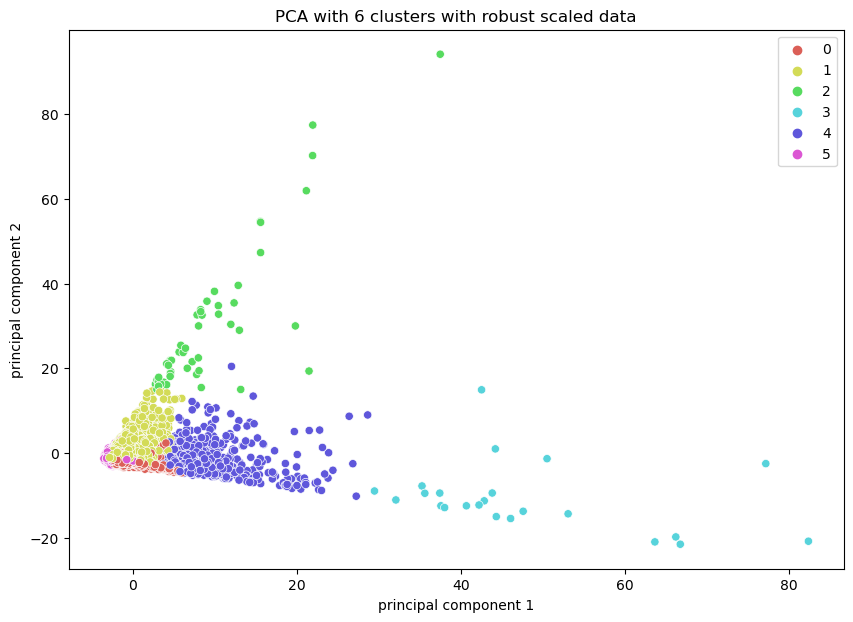

In [65]:
#pca
# n components = 6 with robust scaled data  

from sklearn.cluster import KMeans

pca = PCA(n_components=n_components)
principalComponents = pca.fit_transform(df_trans_robust)

df_pca = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5', 'principal component 6'])

kmeans_pca = KMeans(n_clusters=6, random_state=20, n_init="auto") .fit(df_pca)
plt.figure(figsize=(10, 7))

sns.scatterplot(x=df_pca['principal component 1'], y=df_pca['principal component 2'], hue=kmeans_pca.labels_, palette=sns.color_palette('hls', 6))
plt.title("PCA with 6 clusters with robust scaled data")     
plt.xlabel("principal component 1")
plt.ylabel("principal component 2")
plt.show()

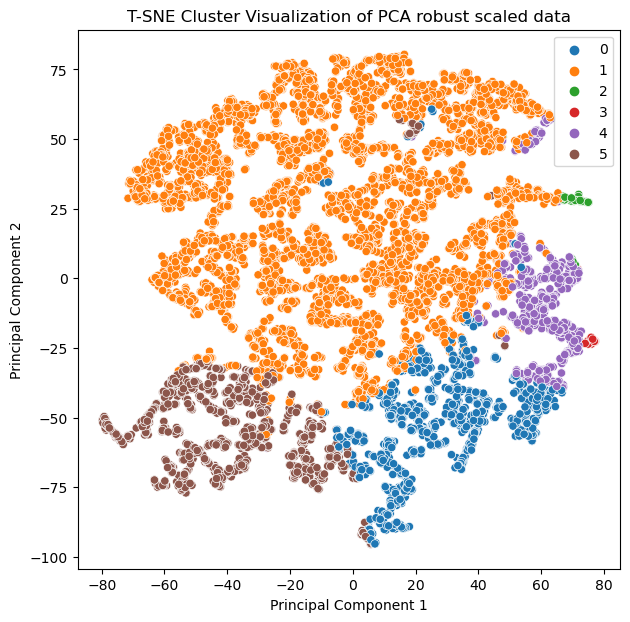

In [68]:
# tsne to visualize the clusters after pca
draw_tsne(data=df_pca, c=kmeans_pca.labels_, text="PCA robust scaled data")

### The data is more sperated after performing the pca with only 6 clusters
## .

## Repeat the previous steps with standard scaled dataset

In [70]:
#pca
# n components = 8 with standard scaled data  

from sklearn.cluster import KMeans

#pca to find the number of components to keep 85% of variance

from sklearn.decomposition import PCA
pca = PCA().fit(df_trans_standard)


# Find the number of components to keep 85% of variance
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)
n_components = np.argmax(cumulative_variance_ratio >= 0.85) + 1
print("PCA: number of components to keep 85% of variance is ==> ", n_components, "\n")




# the contribution of each feature to each principal component
# features with higher correlation and importance are selected
# the features are NOT in the same order as the principal components


ii=1
for i in pca.explained_variance_ratio_:
    print(f"feature {ii}",round(i*100,2), "%")
    ii+=1
    if ii== n_components+1:
        print("\n--------- stop here ---------\n")  


PCA: number of components to keep 85% of variance is ==>  8 

feature 1 27.29 %
feature 2 20.3 %
feature 3 8.79 %
feature 4 7.48 %
feature 5 6.26 %
feature 6 5.75 %
feature 7 4.89 %
feature 8 4.26 %

--------- stop here ---------

feature 9 3.83 %
feature 10 3.08 %
feature 11 2.37 %
feature 12 1.77 %
feature 13 1.43 %
feature 14 1.22 %
feature 15 1.01 %
feature 16 0.27 %
feature 17 0.0 %


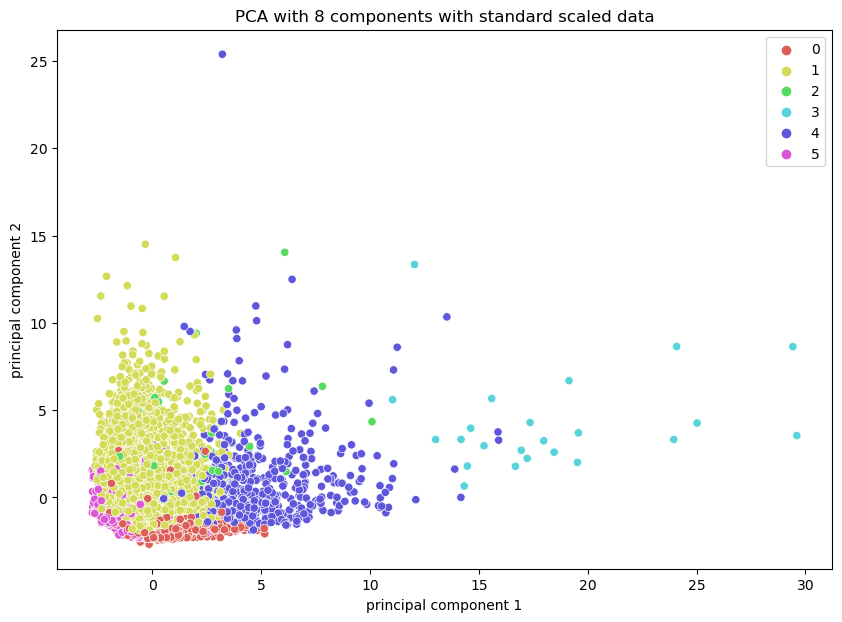

In [71]:
#pca with 8 components with standard scaled data
# 6 clusters

pca = PCA(n_components=n_components)
principalComponents = pca.fit_transform(df_trans_standard)

df_pca_standard = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5', 'principal component 6','principal component 7' ,'principal component 8'])

kmeans_pca = KMeans(n_clusters=6, random_state=20, n_init="auto") .fit(df_pca)
plt.figure(figsize=(10, 7))

sns.scatterplot(x=df_pca_standard['principal component 1'], y=df_pca_standard['principal component 2'], hue=kmeans_pca.labels_, palette=sns.color_palette('hls', 6))
plt.title("PCA with 8 components with standard scaled data")    
plt.xlabel("principal component 1")
plt.ylabel("principal component 2")
plt.show()

### In the previous comparison to achieve 85% of the total variance 
- when using the robust scaled data, the n components were 6 <br/>
<br/>
- when using the standard scaled data, the n components were 8 <br/>

### So, it is recommended to have a proper transformation for the data before performing the PCA
### .

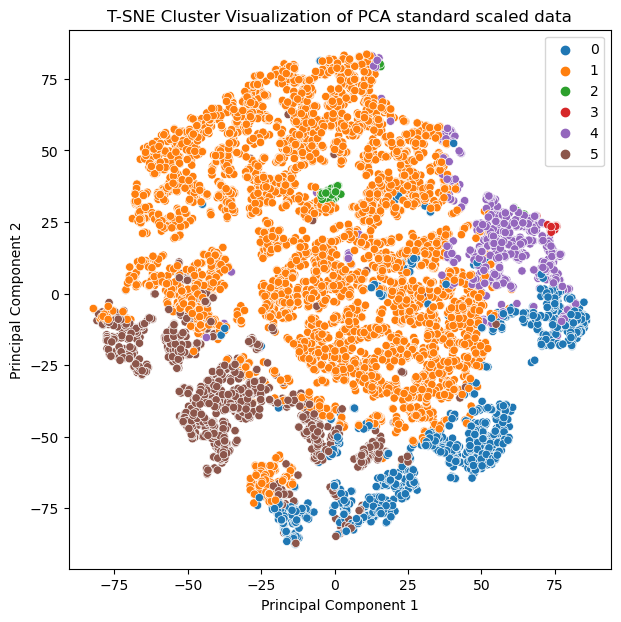

In [69]:
# tsne to visualize the clusters after pca

draw_tsne(data=df_pca_standard, c=kmeans_pca.labels_, text="PCA standard scaled data")

### The clusters are more sperated, but not as good as the robust scalled data 
## .

(8949, 17)

In [74]:
# pca for log scaled data

#pca
# n components = 7 with standard scaled data  

from sklearn.cluster import KMeans

#pca to find the number of components to keep 85% of variance

from sklearn.decomposition import PCA
pca = PCA().fit(df_trans_log)


# Find the number of components to keep 85% of variance
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)
n_components = np.argmax(cumulative_variance_ratio >= 0.85) + 1
print("PCA: number of components to keep 85% of variance is ==> ", n_components, "\n")




# the contribution of each feature to each principal component
# features with higher correlation and importance are selected
# the features are NOT in the same order as the principal components


ii=1
for i in pca.explained_variance_ratio_:
    print(f"feature {ii}",round(i*100,2), "%")
    ii+=1
    if ii== n_components+1:
        print("\n--------- stop here ---------\n")  


PCA: number of components to keep 85% of variance is ==>  7 

feature 1 34.47 %
feature 2 21.59 %
feature 3 9.44 %
feature 4 7.31 %
feature 5 6.69 %
feature 6 5.27 %
feature 7 4.21 %

--------- stop here ---------

feature 8 3.06 %
feature 9 2.71 %
feature 10 1.54 %
feature 11 1.09 %
feature 12 0.82 %
feature 13 0.6 %
feature 14 0.54 %
feature 15 0.27 %
feature 16 0.24 %
feature 17 0.15 %


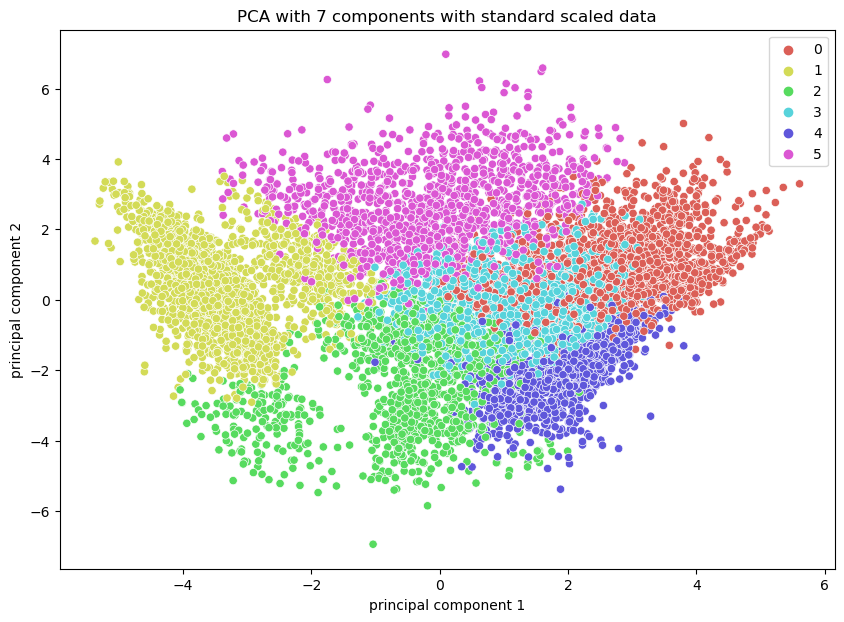

In [75]:
#pca with 7 components with standard scaled data
# 6 clusters

pca = PCA(n_components=n_components)
principalComponents = pca.fit_transform(df_trans_log)

df_pca_log = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5', 'principal component 6','principal component 7' ])

kmeans_pca = KMeans(n_clusters=6, random_state=20, n_init="auto") .fit(df_pca_log)
plt.figure(figsize=(10, 7))

sns.scatterplot(x=df_pca_log['principal component 1'], y=df_pca_log['principal component 2'], hue=kmeans_pca.labels_, palette=sns.color_palette('hls', 6))
plt.title("PCA with 7 components with standard scaled data")    
plt.xlabel("principal component 1")
plt.ylabel("principal component 2")
plt.show()

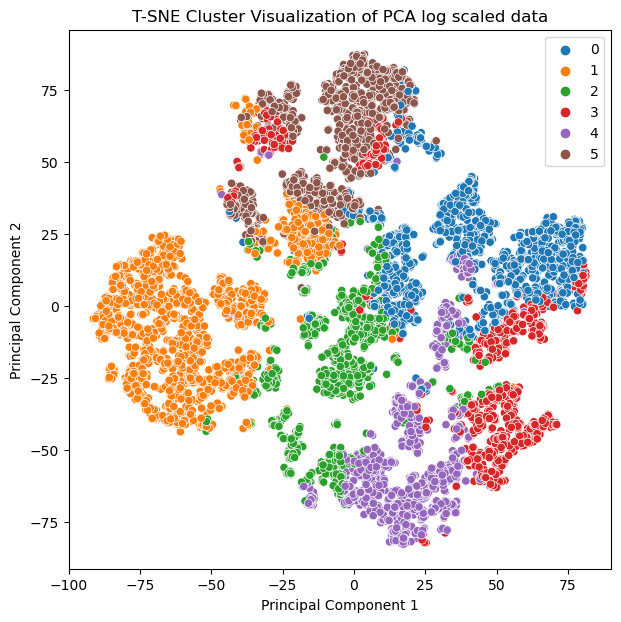

In [57]:

#tsne 
draw_tsne(data=df_pca_log, c=kmeans_pca.labels_, text="PCA log scaled data")


### Log scaled data showed the best clustering for the data with only 6 clusters 
## .

In [58]:
# pca data using the robust scaled data 

df_pca_log

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6,principal component 7
0,-0.258963,-2.680031,-0.285504,-1.039242,0.220350,-0.356145,-0.718508
1,-3.484599,0.989032,-0.035899,0.043457,-1.756546,-0.287710,0.774645
2,1.468627,1.279350,2.719969,-0.988742,0.668274,-0.201443,0.483324
3,-1.373364,-0.762979,1.757355,-1.113300,1.785884,2.289961,0.420259
4,-1.151181,-1.370821,0.954718,-1.575358,0.125417,-1.396392,-0.255016
...,...,...,...,...,...,...,...
8944,1.739169,-2.879832,-2.115604,2.435157,2.242989,-2.190150,1.928625
8945,1.168109,-1.928871,-2.323292,0.775477,3.346500,-0.966451,2.183598
8946,1.067603,-3.251136,-1.792169,1.897266,2.949160,-1.282839,1.905771
8947,-2.782718,-3.866753,-0.503507,2.535525,2.864524,-2.014030,1.017789


## kernal PCA

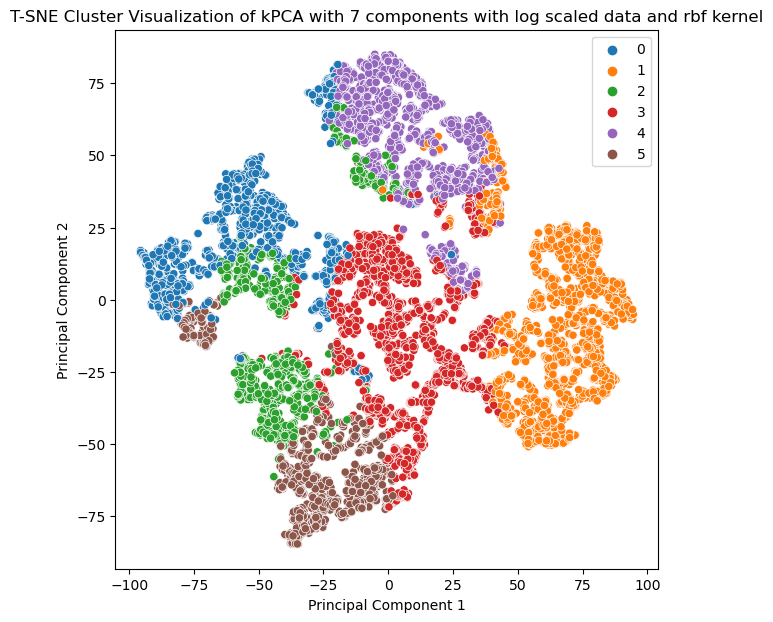

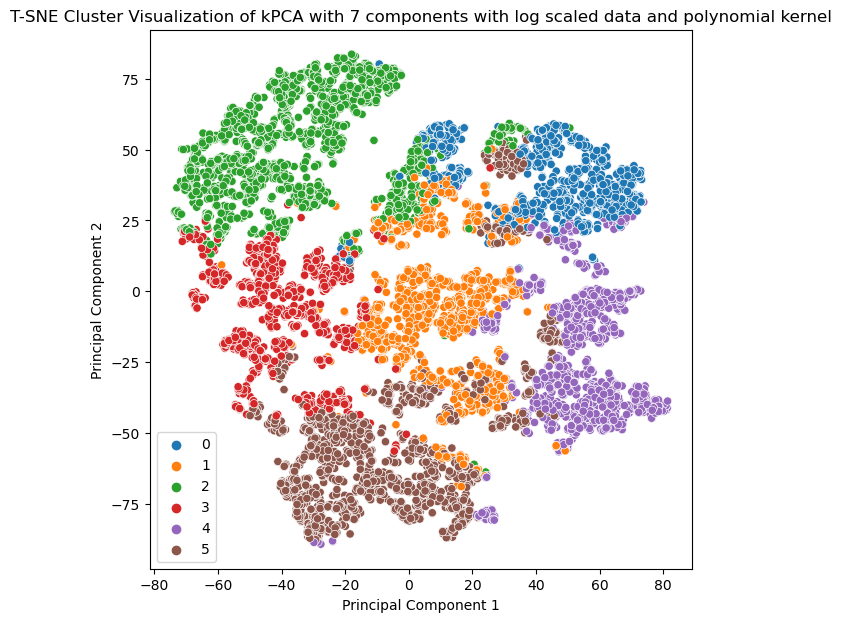

In [67]:
# kernal pca for the log scaled data then kmeans

from sklearn.decomposition import KernelPCA

# n components = 7 with log scaled  
# rbf kernel  

kpca = KernelPCA(n_components=7, kernel="rbf")
df_kPCA = kpca.fit_transform(df_trans_log)

kmeans_pca_kernal = KMeans(n_clusters=6, random_state=20, n_init="auto") .fit(df_kPCA)
draw_tsne(data=df_kPCA, c=kmeans_pca_kernal.labels_, text="kPCA with 7 components with log scaled data and rbf kernel")


# polynomial kernel 

kpca_poly = KernelPCA(n_components=7, kernel="poly", degree=4)
df_kPCA_poly = kpca_poly.fit_transform(df_trans_log)

kmeans_pca_poly = KMeans(n_clusters=6, random_state=20, n_init="auto") .fit(df_kPCA_poly)
draw_tsne(data=df_kPCA_poly, c=kmeans_pca_poly.labels_, text="kPCA with 7 components with log scaled data and polynomial kernel")

### Normal PCA VS kernal PCA ("RBF")

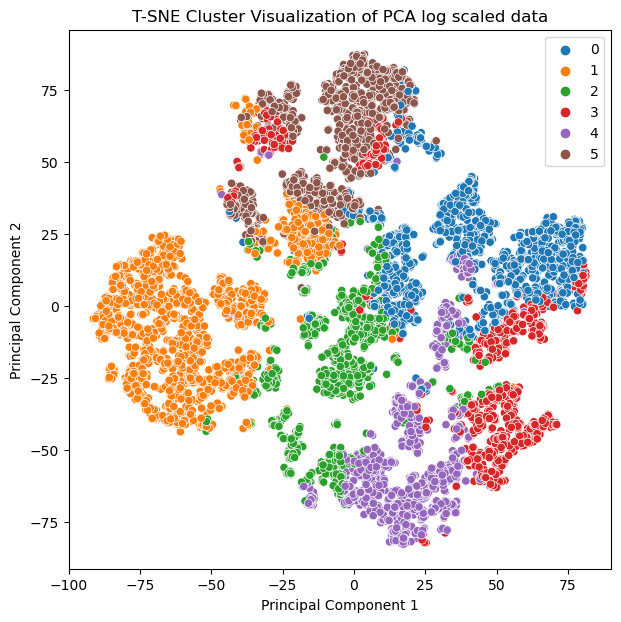

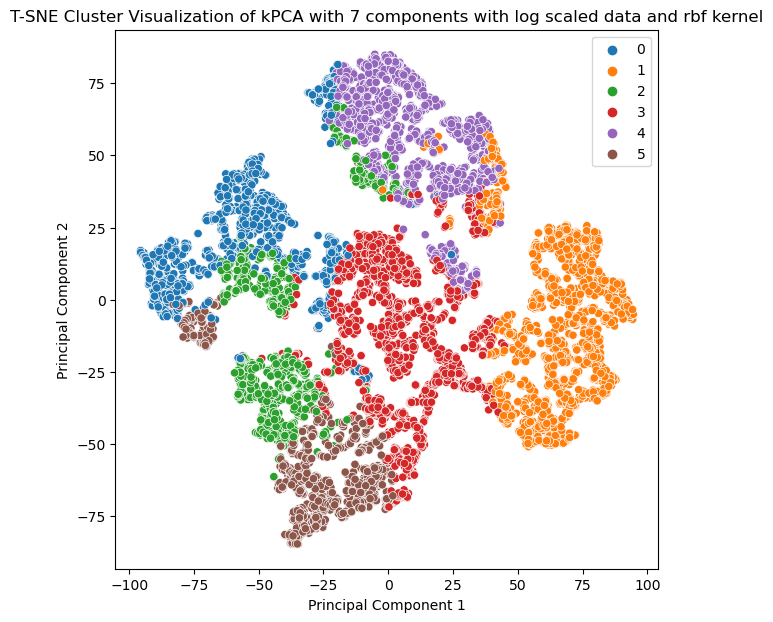

In [83]:
# tsne of the normal pca 
draw_tsne(data=df_pca_log, c=kmeans_pca.labels_, text="PCA log scaled data")

# tsne of the kernal pca 
draw_tsne(data=df_kPCA, c=kmeans_pca_kernal.labels_, text="kPCA with 7 components with log scaled data and rbf kernel")


### From the previous graphs applying kernel "RBF" enhanced the results a lot compared to the normal PCA 
the advance is in the context of the separation between the clusters


## .

### Gap statistics method 


In [59]:
# gap statistics method 

from sklearn.utils import shuffle
from sklearn.cluster import KMeans


def gap_statistic(df, max_K = 10, b = 20 ):

    # maximum number of clusters 
    max_K = 10
    # number of bootstrap samples (number of times we will re-sample the data)
    b = 20

    inertia_gap = np.array([])

    # Inertia values with K-Means
    for k in range(1,max_K+1):
        km = KMeans(n_clusters=k,n_init=10)
        km.fit(df)
        inertia_gap=np.append(inertia_gap,km.inertia_)

    # Matrix of results from simulations
    mat_inertia_gap = np.array([])

    for i in range(b):
        # Generate random data
        shuffled_df = df.apply(axis=0,func=lambda x:shuffle(x.values))

        for k in range(1,max_K+1):
            km = KMeans(n_clusters=k,n_init=10)
            km.fit(shuffled_df)
            mat_inertia_gap=np.append(mat_inertia_gap,km.inertia_) 
    mat_inertia_gap = mat_inertia_gap.reshape((b,max_K))


    # Gap statistic
    gap_stat = np.mean(np.log(mat_inertia_gap),axis=0) - np.log(inertia_gap)
    
    return gap_stat



## Investigate the optimum number of clusters for the robust.log and standard scaled dataframes
### before performing the PCA

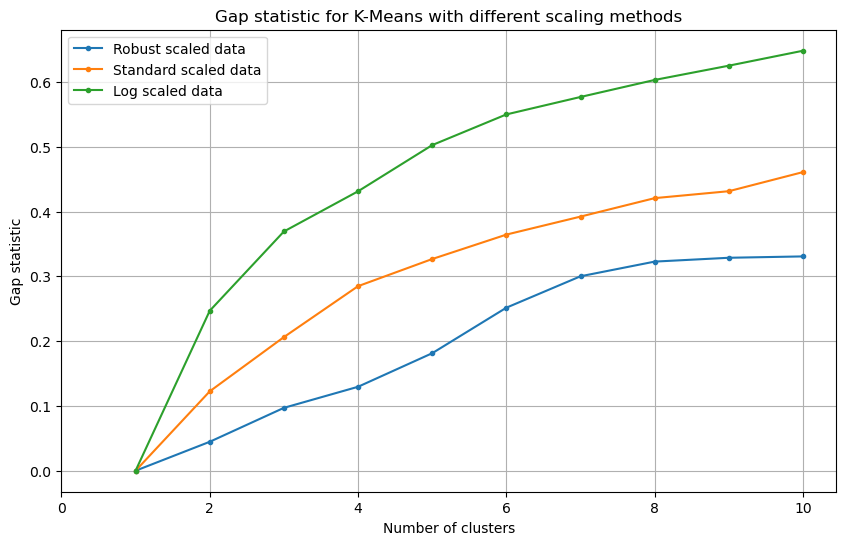

In [60]:

# Gap statistic comparison
max_K = 10
b = 20

# Gap statistic with robust scaled data
gap_stat_robust = gap_statistic(df_trans_robust, max_K, b)

# Gap statistic with standard scaled data
gap_stat_standard = gap_statistic(df_trans_standard, max_K, b)

# Gap statistic with log scaled data
gap_stat_log = gap_statistic(df_trans_log, max_K, b)

# Plot both gap statistics in one plot with a legend
plt.figure(figsize=(10, 6))

plt.plot(np.arange(1, max_K + 1), gap_stat_robust, marker='.', label='Robust scaled data')
plt.plot(np.arange(1, max_K + 1), gap_stat_standard, marker='.', label='Standard scaled data')
plt.plot(np.arange(1, max_K + 1), gap_stat_log, marker='.', label='Log scaled data')

plt.xlabel('Number of clusters')
plt.xticks(range(0, max_K + 1, 2))
plt.ylabel('Gap statistic')
plt.title('Gap statistic for K-Means with different scaling methods')
plt.grid()
plt.legend()

plt.show()


## Investiage the optimum cluster numbers after the pca 

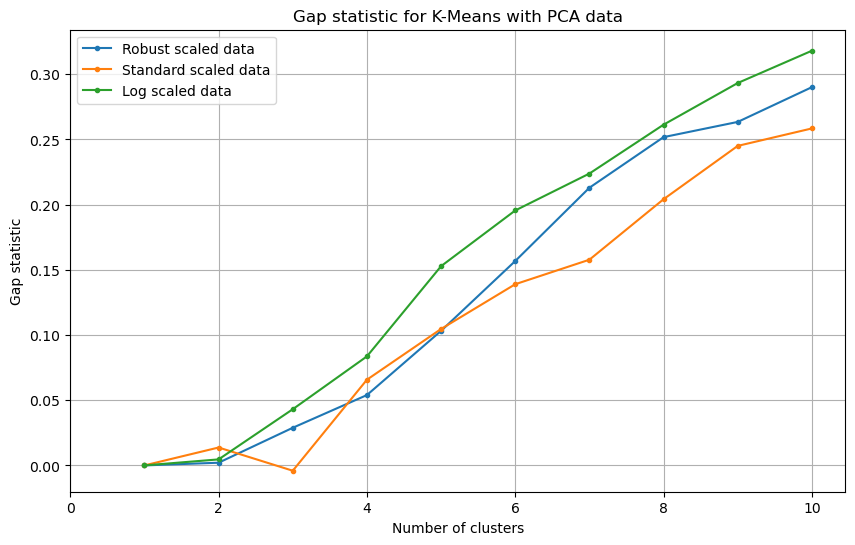

In [72]:


# Gap statistic comparison
max_K = 10
b = 20

# Gap statistic with robust scaled data
gap_stat_robust = gap_statistic(df_pca, max_K, b)

# Gap statistic with standard scaled data
gap_stat_standard = gap_statistic(df_pca_standard, max_K, b)

# Gap statistic with log scaled data
gap_stat_log = gap_statistic(df_pca_log, max_K, b)


# Plot both gap statistics in one plot with a legend
plt.figure(figsize=(10, 6))

plt.plot(np.arange(1, max_K + 1), gap_stat_robust, marker='.', label='Robust scaled data')
plt.plot(np.arange(1, max_K + 1), gap_stat_standard, marker='.', label='Standard scaled data')
plt.plot(np.arange(1, max_K + 1), gap_stat_log, marker='.', label='Log scaled data')

plt.xlabel('Number of clusters')
plt.xticks(range(0, max_K + 1, 2))
plt.ylabel('Gap statistic')
plt.title('Gap statistic for K-Means with PCA data')
plt.grid()
plt.legend()

plt.show()


### From the previous comparison after performing the PCA log, robust and standard scaler 
- the log scaled data is the best regarding the lowest number of the clusters needed
- the curve is steeper in the log scaled transformation <br/>
- the number of the clusters when using the log scaled will be smaller compared to robust and standard scaled 
- It is obvious the the robust scaled data is better after adding the PCA compared to the standard scaled data 

## .
## .

## To sum up the best segmentation of the data is through 
### log scaling and kernal ("rbf")  pca with n component of 6
# .

### Excract the business meanings of the case study 

In [84]:
# extract the business meanings after the segmentation 

# add the labels to the RAW dataframe
df_raw_labels = df_raw.copy()
df_raw_labels.dropna(subset=["CREDIT_LIMIT"],inplace=True)

df_raw_labels['Cluster_Labels'] = kmeans_pca_kernal.labels_


In [85]:
# group the data by the labels
cluster_dfs = {}
for label, group in df_raw_labels.groupby('Cluster_Labels'):
    cluster_dfs[label] = group


### Plot the histogram of each cluster 

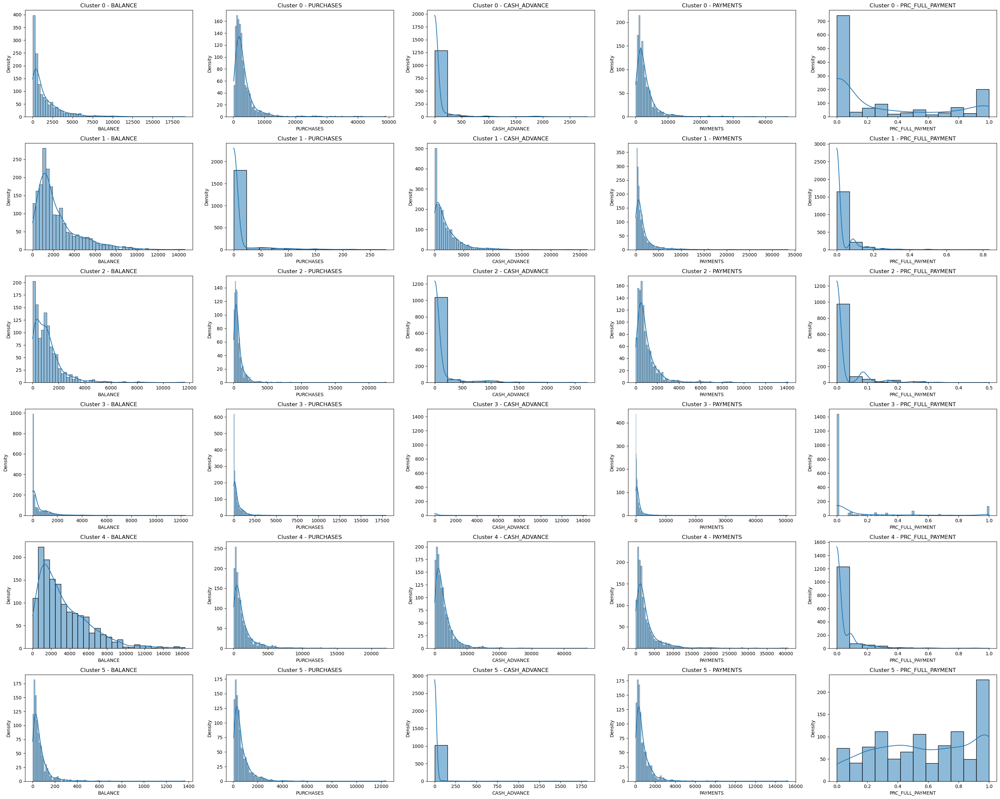

In [86]:
# plot the feature distribution for each cluster WITH NO FREQUENCY INFORMATION FEATURES

feature_columns = ['BALANCE', 'PURCHASES', 'CASH_ADVANCE','PAYMENTS', 'PRC_FULL_PAYMENT']

fig, axes = plt.subplots(6, len(feature_columns), figsize=(len(feature_columns) * 6, 24))

for i, (label, group) in enumerate(cluster_dfs.items()):
    for j, feature in enumerate(feature_columns):
        sns.histplot(group[feature], kde=True, ax=axes[i, j])
        axes[i, j].set_title(f'Cluster {label} - {feature}')
        axes[i, j].set_xlabel(feature)
        axes[i, j].set_ylabel('Density')

plt.tight_layout()
plt.show()


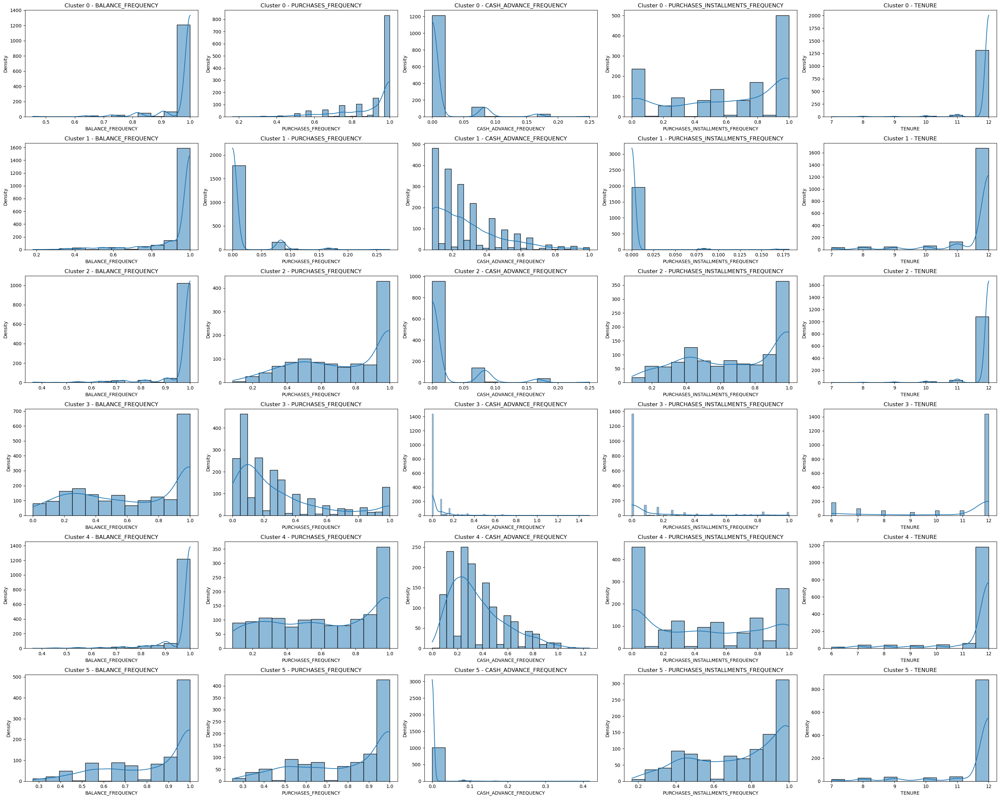

In [87]:
# # plot the feature distribution for each cluster WITH  FREQUENCY INFORMATION FEATURES

feature_columns = ['BALANCE_FREQUENCY', 'PURCHASES_FREQUENCY', 'CASH_ADVANCE_FREQUENCY','PURCHASES_INSTALLMENTS_FREQUENCY', 'TENURE']

fig, axes = plt.subplots(6, len(feature_columns), figsize=(len(feature_columns) * 6, 24))

for i, (label, group) in enumerate(cluster_dfs.items()):
    for j, feature in enumerate(feature_columns):
        sns.histplot(group[feature], kde=True, ax=axes[i, j])
        axes[i, j].set_title(f'Cluster {label} - {feature}')
        axes[i, j].set_xlabel(feature)
        axes[i, j].set_ylabel('Density')

plt.tight_layout()
plt.show()

## .

## THE CLUSTERS ACCORDING TO THEIR BEHAVIOUR 

CLUSTER 0: highest in purchases and installment frequency of the customers <br/>
CLUSTER 1: highest balance frequency and purchases values of the customers and the oldest bank customers <br/>
CLUSTER 2: represent the midle class in the values of the balance and purchases <br/> 
CLUSTER 3: highest balance and purchases values amoung the smallest group of accounts <br/>
CLUSTER 4: the highest cash advance customers <br/>
CLUSTER 5: lowest values of balances of the customers and highest prc full payment customers <br/>
